<a href="https://colab.research.google.com/github/ritafolisi/MSA_project/blob/main/dogs_cats_classification_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports and setup

In [ ]:
IN_COLAB = False
try:
    from google.colab import drive
    IN_COLAB = True
except:
    IN_COLAB = False


In [ ]:
BASE_DIR = "drive/MyDrive/StatisticalMethodsData/" if IN_COLAB else ""
DATA_DIR = "CatsDogs"
CONVERTED_DIR = "converted"
AUGMENTED_DIR = f"{DATA_DIR}_augmented"
ROOT_DIR = "/content" if IN_COLAB else ".."
DATA_DOWNLOAD_FILENAME = f"{BASE_DIR}data.zip"
DATA_DOWNLOAD_URL = "https://unimibox.unimi.it/index.php/s/eNGYGSYmqynNMqF/download"

IMAGE_SIZE = (128, 128)

DO_PREPROCESSING = True

if IN_COLAB:
    drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import warnings
warnings.filterwarnings('ignore')


In [ ]:
%pip install rich --quiet
%pip install keras-tuner --quiet
%pip install keract
%pip install tf-keras-vis --quiet


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 238.9/238.9 KB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 KB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.7/135.7 KB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 27.5 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.1/52.1 KB 3.0 MB/s eta 0:00:00


In [ ]:
from datetime import datetime
import collections.abc
from keras.utils import image_dataset_from_directory
from keras.optimizers import SGD, Adam, Nadam, RMSprop
from keras_tuner import HyperParameters, BayesianOptimization, Objective, HyperModel, Hyperband
from keras.models import *
from keras.layers.convolutional import Conv2D, MaxPooling2D
from keras.layers import Input, Dense, Flatten, Dropout, BatchNormalization, Activation
from keras.metrics import TruePositives, TrueNegatives, FalsePositives, FalseNegatives, Accuracy, Precision, Recall, AUC
from keras import initializers
import shutil
import urllib.request
from itertools import zip_longest
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import random
import json
import math
import seaborn as sns
from PIL import Image
import os
import cv2
from contextlib import contextmanager
from typing import *
from keras.preprocessing.image import ImageDataGenerator
import time
import inspect
from keract import get_activations, display_activations
from tf_keras_vis.utils.scores import BinaryScore
from matplotlib import cm
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.gradcam import GradcamPlusPlus
from IPython.display import display, Markdown
from sklearn.metrics import confusion_matrix

from rich.progress import *
del open    # Do this after importing rich.progress


%matplotlib inline


In [ ]:
print(f"Tensorflow version: {tf.__version__}")


Tensorflow version: 2.9.2


In [ ]:
# If no zip exists with name DATA_DOWNLOAD_FILENAME, download it from DATA_DOWNLOAD_URL
if not os.path.exists(DATA_DOWNLOAD_FILENAME):
    def track_progress(bar: Progress, task: TaskID):
        def show_progress(block_num, block_size, total_size):
            bar.update(task, advance=block_size)
        return show_progress

    terminal_bar = [
        TextColumn("[progress.description]{task.description}"),
        SpinnerColumn(),
        DownloadColumn(),
        TransferSpeedColumn(),
        TaskProgressColumn(),
        TimeElapsedColumn()
    ]

    with Progress(*terminal_bar) as progress:
        dataset_download = progress.add_task(
            "[orange]Downloading dataset...", total=None)
        progress.update(dataset_download, refresh=True)

        urllib.request.urlretrieve(
            DATA_DOWNLOAD_URL,
            DATA_DOWNLOAD_FILENAME,
            track_progress(progress, dataset_download)
        )

        progress.tasks[dataset_download].total = progress.tasks[dataset_download].completed
        progress.update(
            dataset_download,
            description="[green]Download done",
            refresh=True
        )


In [ ]:
# Extract the dataset zip if not done already
if not os.path.exists(CONVERTED_DIR) and os.path.exists(f"{BASE_DIR}converted.zip"):
    shutil.unpack_archive(f"{BASE_DIR}converted.zip")
elif not os.path.exists(DATA_DIR) and os.path.exists(DATA_DOWNLOAD_FILENAME):
    shutil.unpack_archive(DATA_DOWNLOAD_FILENAME)


# Preprocessing

## Function definitions

In [ ]:
def show(
    images: List[np.ndarray],
    title: str = "",
    ncols: int = 0,
    nrows: int = 0,
    labels: List[str] = [],
    overlays: Dict[int, np.ndarray] = {}
):
    """Show images and labels in the desired grid layout

    Arrange and show images (with their optional respective labels) arranged in the smallest suitable square grid, or
    according to the dimension specified in the parameters.

    :param images: the list of images to be shown
    :param title: title of the output
    :param ncols: specify in how many columns the images should be shown. If not specified, it is calculated using
        the nrows parameter or the number of images
    :param nrows: specify in how many rows the images should be shown. If not specified, it is calculated using the
        ncols parameter or the number of images
    :param labels: labels for each image
    :param overlays: optional layers to show overlayed to the corresponding image and their alpha
    """

    images = list(map(lambda image: image if image.dtype ==
                  np.uint8 else image.astype("uint8"), images))

    if len(labels) <= len(images):
        images = list(zip_longest(images, labels, fillvalue=""))
    sqrt = math.sqrt(len(images))
    if not nrows:
        if ncols:
            nrows = math.ceil(len(images) / ncols)
        else:
            nrows = int(sqrt) if sqrt - int(sqrt) < 0.5 else int(sqrt) + 1
    if not ncols:
        if nrows:
            ncols = math.ceil(len(images) / nrows)
        else:
            ncols = math.ceil(sqrt)

    fig = plt.figure()
    if title:
        fig.suptitle(title)


    for index, (image, label) in enumerate(images):
        ax = fig.add_subplot(nrows, ncols, index + 1)
        ax.axis('off')
        ax.set_title(label)
        ax.imshow(image)
        if index in overlays:
            for overlay, alpha in overlays[index]:
                ax.imshow(overlay, alpha=alpha)

    fig.tight_layout()
    plt.tight_layout()
    plt.show()


def convert_to_bgr(image: np.ndarray) -> np.ndarray:
    return cv2.cvtColor(image, cv2.COLOR_RGB2BGR)


def convert_to_rgb(image: np.ndarray) -> np.ndarray:
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


def convert_to_greyscale(image: np.ndarray) -> np.ndarray:
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)


def apply_erosion(
    image: np.ndarray,
    kernel_size: Tuple[int, int] = (3, 3),
    kernel_shape: int = cv2.MORPH_RECT
) -> np.ndarray:
    kernel = cv2.getStructuringElement(kernel_shape, kernel_size)
    return cv2.erode(image, kernel)


def apply_dilation(
    image: np.ndarray,
    kernel_size: Tuple[int, int] = (3, 3),
    kernel_shape: int = cv2.MORPH_RECT
) -> np.ndarray:
    kernel = cv2.getStructuringElement(kernel_shape, kernel_size)
    return cv2.dilate(image, kernel)


def closing(img): return apply_erosion(apply_dilation(img))


def opening(img): return apply_dilation(apply_erosion(img))


def apply_resize(
    image: np.ndarray,
    size: Tuple[int, int] = (256, 256),
    padding_color: int = 0
) -> np.ndarray:
    h, w = image.shape[:2]
    if (h, w) == size:
        return image
    sh, sw = size

    # interpolation method
    if h > sh or w > sw:  # shrinking image
        interp = cv2.INTER_AREA
    else:  # stretching image
        interp = cv2.INTER_LINEAR

    # aspect ratio of image
    aspect = w / h

    # compute scaling and pad sizing
    pad_top, pad_left = 0, 0
    if aspect > 1:  # horizontal image (landscape)
        new_w = sw
        new_h = int(np.round(new_w / aspect))
        pad_bot = (sh - new_h)
        pad_right = 0
    elif aspect < 1:  # vertical image (portrait)
        new_h = sh
        new_w = int(np.round(new_h * aspect))
        pad_right = (sw - new_w)
        pad_bot = 0
    else:  # square image
        new_h, new_w = sh, sw
        pad_right, pad_bot = 0, 0

    # set pad color
    padding_color = [padding_color] * len(image.shape)

    # scale and pad
    scaled_img = cv2.resize(image, (new_w, new_h), interpolation=interp)
    scaled_img = cv2.copyMakeBorder(
        scaled_img,
        pad_top,
        pad_bot,
        pad_left,
        pad_right,
        borderType=cv2.BORDER_CONSTANT,
        value=padding_color
    )

    return scaled_img


def augmentation() -> Callable[[np.ndarray, List[int], int], Union[List[np.ndarray], Tuple[List[np.ndarray], List[np.ndarray]]]]:
    """
    Prepare a generator with default preset values of transofrmation to be applied to images
    """
    datagen = ImageDataGenerator(
        rotation_range=40,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        brightness_range=(0.5, 1.5),
        dtype=np.uint8)

    def apply_augmentation(
        images: Sequence[np.ndarray],
        labels: List[int] = None,
        count: int = 5
    ) -> Union[List[np.ndarray], Tuple[List[np.ndarray], List[np.ndarray]]]:
        """
        Apply a random transformation to each of the images in the list
        
        :param images: the images to be manipulated
        :param labels: optional labels associated to the images
        :param count: how many transformed version for each image to generate
        :return: the list of transformed images or, if labels were supplied, a list of tuples of (image, label)
        """
        if labels:
            iterator = datagen.flow(np.asarray(
                images), labels, batch_size=len(images))
        else:
            iterator = datagen.flow(np.asarray(
                images), batch_size=len(images))
        res = [iterator.next() for _ in range(count)]
        return res

    return apply_augmentation


def trim(image: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    grey = convert_to_greyscale(image)
    # Invert the image (use 96 instead of 128 to allow for some approximation with grey borders)
    inverted = 255 * (grey < 96)
    coords = cv2.findNonZero(inverted)  # Find all non-zero points
    x, y, w, h = cv2.boundingRect(coords)  # Find minimum spanning bounding box
    # Crop the image - note we do this on the original image
    return image[y:y + h, x:x + w], grey[y:y + h, x:x + w]


def save(path: str, image: np.ndarray) -> bool:
    return cv2.imwrite(path, convert_to_bgr(image))


def read(path: str) -> np.ndarray:
    try:
        image = np.array(Image.open(path).convert('RGB'))
        if image is not None and image.size > 0:
            return image
        else:
            return None
    except:
        return None


In [ ]:
def augment_folder(rootdir: str = "", frac: float = 0.2, step_size: int = 1000) -> List[str]:
    """
    Arrange and show images (with their optional respective labels) arranged in the smallest suitable square grid, or
    Extract a sample of images from the specified folder and apply random transformations to each of the extracted
    images. Generated images will be found in the "Augmented" subfolder

    :param rootdir: the folder where all images are located
    :param frac: fraction of the images to choose
    :step_size: how many images to process at once (using keras ImageDataGenerator)
    :return: the list of the generated images' paths
    """

    files_count = (int)((frac) * len(os.listdir(rootdir)))

    aug_directory = rootdir + "/Augmented"
    os.makedirs(aug_directory, exist_ok=True)

    aug_images = list()
    apply_augmentation = augmentation()
    names = list()

    # Choose a random subset from the images in the folder
    # random.seed(1) # For reproducibility, specifying the same seed will yeld the same files
    filenames = random.sample(os.listdir(rootdir), files_count)
    # Divide the filenames in chuncks to be processed together
    filenames_chunks = [filenames[i:i + step_size]
                        for i in range(0, len(filenames), step_size)]
    chunks_done = 0

    terminal_bar = [
        TextColumn("[progress.description]{task.description}"),
        BarColumn(),
        MofNCompleteColumn(),
        TaskProgressColumn(),
        TimeRemainingColumn(),
        TimeElapsedColumn()
    ]

    with Progress(*terminal_bar) as progress:
        image_conversion = progress.add_task(
            "[green]Data Augmentation...", total=files_count)
        progress.update(image_conversion, refresh=True)

        for filenames in filenames_chunks:
            images = []
            descriptions = []
            # Load image in a chunk
            for filename in filenames:
                filepath = os.path.join(rootdir, filename)
                name, ext = os.path.splitext(filepath.lstrip(rootdir))
                image = read(filepath)
                if image is not None:
                    images.append(apply_resize(image, size=IMAGE_SIZE))
                    descriptions.append(name)

            res = apply_augmentation(images=images, labels=descriptions)

            index = 0
            for imgs, lbls in res:
                for pair in zip(imgs, lbls):
                    aug_converted = False
                    aug_path = os.path.join(
                        aug_directory, f"{pair[1]}_{index}.jpg".lstrip("/\\"))
                    aug_converted = save(aug_path, pair[0])
                    if aug_converted:
                        aug_images.append(aug_path)
                index += 1
            progress.update(image_conversion, advance=len(filenames))
        progress.update(image_conversion, refresh=True)
    return aug_images


In [ ]:
def convert_folder(
    rootdir: str = "",
    to_greyscale: bool = False,
    depth: int = 0
) -> Tuple[List[str], List[str], List[str]]:
    """Convert all images in a directory (and subdirectories) to the desired color mode

    Convert all images in a directory and its subdirectories up to the specified depth either to rgb or greyscale. If
    not specified, the directory to be converted is the one the script is run in. The function returns a list of
    converted filepaths for both color modes and a list of filepath for which conversion did not occur.

    :param rootdir: the target directory holding images to convert
    :param to_greyscale: control whether to convert images to greyscale mode
    :param depth: depth of traversal for subdirectories; 0 means fully recursive
    :return: a 3-list tuple specifying paths of file converted to rgb, converted to greyscale, or not converted
    """
    keyboard_interrupt = False

    folder = os.path.basename(os.path.normpath(rootdir)).rstrip('.')
    rgb_directory = os.path.join(CONVERTED_DIR, f"rgb/{folder}")
    greyscale_directory = os.path.join(CONVERTED_DIR, f"greyscale/{folder}")
    os.makedirs(rgb_directory, exist_ok=True)
    os.makedirs(greyscale_directory, exist_ok=True)

    rgb_images = list()
    greyscale_images = list()
    not_converted = list()

    files_count = 0
    current_depth = 1
    for root, dirs, files in os.walk(rootdir or "."):
        if depth and current_depth > depth:
            break

        files_count += len(files)
        current_depth += 1

    terminal_bar = [
        TextColumn("[progress.description]{task.description}"),
        BarColumn(),
        MofNCompleteColumn(),
        TaskProgressColumn(),
        TimeRemainingColumn(),
        TimeElapsedColumn()
    ]

    with Progress(*terminal_bar) as progress:
        image_conversion = progress.add_task(
            "[orange]Converting images...", total=files_count)
        progress.update(image_conversion, refresh=True)

        current_depth = 1
        for root, directories, filenames in os.walk(rootdir or "."):
            if depth and current_depth > depth:
                break

            for filename in filenames:
                rgb_converted = False
                greyscale_converted = False
                filepath = os.path.join(root, filename)
                name, ext = os.path.splitext(filepath.lstrip(rootdir))
                try:
                    image = read(filepath)
                    if image is not None:

                        image = closing(image)
                        image = apply_resize(image, IMAGE_SIZE)

                        # Save RGB and greyscale images
                        rgb_path = os.path.join(
                            rgb_directory, f"{name}_rgb.jpg".lstrip("/\\"))
                        rgb_converted = save(rgb_path, image)
                        if rgb_converted:
                            rgb_images.append(rgb_path)
                        if to_greyscale:
                            greyscale_path = os.path.join(
                                greyscale_directory, f"{name}_greyscale.jpg".lstrip("/\\"))
                            greyscale_image = convert_to_greyscale(image)
                            greyscale_converted = save(
                                greyscale_path, greyscale_image)
                            if greyscale_converted:
                                greyscale_images.append(greyscale_path)

                    else:
                        warnings.warn(f"File {filepath}: could not open")
                except KeyboardInterrupt:
                    keyboard_interrupt = True
                    break
                except Exception as ex:
                    warnings.warn(f"File {filepath}: {ex}")
                finally:
                    if not (rgb_converted and (not to_greyscale or greyscale_converted)):
                        not_converted.append(filepath)
                    progress.update(image_conversion, advance=1)

            if keyboard_interrupt:
                break

            for directory in directories:
                dirpath = os.path.join(root.lstrip(
                    rootdir).lstrip("/\\"), directory)
                os.makedirs(os.path.join(
                    rgb_directory, dirpath), exist_ok=True)
                os.makedirs(os.path.join(
                    greyscale_directory, dirpath), exist_ok=True)

            current_depth += 1

        progress.update(
            image_conversion,
            description="[green]Conversion done",
            completed=len(rgb_images),
            refresh=True
        )

    return rgb_images, greyscale_images, not_converted


Here's an example from our dataset

In [ ]:
DO_PREPROCESSING = not os.path.exists(CONVERTED_DIR)


In [ ]:
if DO_PREPROCESSING:
    file = os.path.join(DATA_DIR, "Cats", "9983.jpg")

    im = read(file)
    show([im], "Example")


## Image removal
Here we remove images that are not useful to our classification task

In [ ]:
if DO_PREPROCESSING:
    c = [666, 835, 1450, 2939, 3216, 3330, 3672, 3822, 4085, 4104, 4338, 4688, 4833, 5351,
         5355, 5418, 5583, 5673, 7377, 7564, 7920, 7968, 8456, 8470, 9171, 9770, 10404,
         10712, 10801, 10863, 11184, 11565, 12272]
    d = [7, 1043, 1194, 1259, 1308, 1773, 1895, 2614, 2877, 4367, 5490, 5604, 5694, 6272,
         6475, 7798, 8507, 8736, 8898, 9188, 9517, 10161, 10190, 10237, 10401, 11702, 10747,
         10797, 10801, 11186, 11299, 11731, 12005, 12027, 12376]

    for img in c:
        file = os.path.join(DATA_DIR, "Cats", f"{img}.jpg")
        try:
            os.remove(file)
        except:
            warnings.warn(f"Could not remove {file}")

    for img in d:
        file = os.path.join(DATA_DIR, "Dogs", f"{img}.jpg")
        try:
            os.remove(file)
        except:
            warnings.warn(f"Could not remove {file}")


## Border trimming
We remove the white borders that occur in some images of the dataset

In [ ]:
if DO_PREPROCESSING:
    trimmed = list(trim(im))
    show([im, trimmed[0]], "Trimming")


Let's do it for each picture of interest

In [ ]:
if DO_PREPROCESSING:
    c = [947, 1876, 4472, 4522, 5183, 6145, 6733,
         8068, 9271, 9751, 9983, 10029, 11031]

    d = [4127, 7076, 9076]

    for img in c:
        file = os.path.join(DATA_DIR, "Cats", f"{img}.jpg")
        try:
            im = read(file)
            im = trim(im)[0]
            save(file, im)
        except:
            warnings.warn(f"Could not trim {file}")

    for img in d:
        file = os.path.join(DATA_DIR, "Dogs", f"{img}.jpg")
        try:
            im = read(file)
            im = trim(im)[0]
            save(file, im)
        except:
            warnings.warn(f"Could not trim {file}")


## Data augmentation
We apply some transformation to each image, such as rotation, zoom and shear transform

In [ ]:
if DO_PREPROCESSING:
    images = [img.tolist()[0] for img in augmentation()([trimmed[0]])]
    show([trimmed[0]] + images, "Data augmentation")


## Execution

In [ ]:
if DO_PREPROCESSING:
    aug_CatsImg = augment_folder(f"{DATA_DIR}/Cats/")
    aug_DogsImg = augment_folder(f"{DATA_DIR}/Dogs/")
    print(len(aug_CatsImg), len(aug_DogsImg))


### Separate augmented dataset from the base one

In [ ]:
if DO_PREPROCESSING:
    # Create a folder to hold the augmented images
    os.makedirs(AUGMENTED_DIR, exist_ok=True)
    # Move the augmented images into this folder
    shutil.move(os.path.join(DATA_DIR, "Cats", "Augmented"),
                f"{AUGMENTED_DIR}/augmented_cats")
    shutil.move(os.path.join(DATA_DIR, "Dogs", "Augmented"),
                f"{AUGMENTED_DIR}/augmented_dogs")


In [ ]:
if DO_PREPROCESSING:
    rgbs_converted, grey_converted, failed = convert_folder(
        rootdir=DATA_DIR, to_greyscale=True)


In [ ]:
if DO_PREPROCESSING:
    print(f"Converted: {len(rgbs_converted)} - {len(grey_converted)}")
    print(f"Failed: {len(failed)}")
    for img in failed:
        print(img)


In [ ]:
if DO_PREPROCESSING:
    rgbs_converted, grey_converted, failed = convert_folder(
        rootdir=AUGMENTED_DIR, to_greyscale=True)


In [ ]:
if DO_PREPROCESSING:
    print(
        f"Converted (augmented set): {len(rgbs_converted)} - {len(grey_converted)}")
    print(f"Failed  (augmented set): {len(failed)}")
    for img in failed:
        print(img)


# CNN definition
Here we defined our CNN models

## Training, validation and test set split

In [ ]:
def tune_dataset(dataset: tf.data.Dataset, batch_size: int = 32) -> tf.data.Dataset:
    return (
        dataset
        .batch(batch_size, drop_remainder=True)
    )


In [ ]:
def split_dataset(
    dataset: tf.data.Dataset,
    validation_split: float = .2,
    test_split: float = None
) -> Tuple[tf.data.Dataset, ...]:
    sample_count = len(dataset)
    validation_count = int(validation_split * (sample_count))
    validation_dataset = dataset.take(validation_count)
    training_dataset = dataset.skip(validation_count)
    if test_split:
        test_count = int(test_split * sample_count)
        test_dataset = training_dataset.take(test_count)
        training_dataset = training_dataset.skip(test_count)
        return training_dataset, validation_dataset, test_dataset
    return training_dataset, validation_dataset


def read_into_datasets(
    path: str,
    seed: int = 42069,
    validation_split: float = None,
    test_split: float = None
) -> Tuple[tf.data.Dataset, ...]:
    dataset = image_dataset_from_directory(
        directory=path,
        labels='inferred',
        label_mode='binary',
        batch_size=None,
        image_size=IMAGE_SIZE,
        shuffle=True,
        seed=seed,
    )

    if validation_split:
        return split_dataset(dataset, validation_split, test_split)
    return dataset


In [ ]:
class NumpyJSONEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        elif isinstance(obj, np.floating):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        else:
            return super().default(obj)


In [ ]:
def plot_histories(
    histories: Union[Dict[dict, dict], List[dict]],
    title: str = "",
    labels: List[str] = [],
    keys: List[str] = ["loss"],
    against_validation: bool = False,
    figsize: Tuple[int, int] = None
) -> None:
    """
    Plot the given training histories one per row, showing only the metrics specified in the parameters.
    The function differentates on matplotlib version: pre-3.4 without subfigures support, and post-3.4
    with subfigures support.

    :param histories: series of training histories to plot
    :param title: image title
    :param labels: optional labels for each image
    :param keys: the metrics to plot in a history
    :param against_validation: if True plots validation metrics using the names in the keys parameters prefixed with "val_"
    :param figsize: size of the image
    """

    if isinstance(histories, dict):
        histories = [v for _, v in histories.items()]

    nrows = len(histories)
    h_keys = []
    for history in histories:
        h_keys.append([key for key in keys if key in history])
    ncols = max([len(hkeys) for hkeys in h_keys])

    if len(labels) <= len(histories):
        histories = list(zip_longest(histories, labels, fillvalue=""))
    else:
        histories = list(zip(histories, labels))

    def newer():
        fig = plt.figure(figsize=figsize, constrained_layout=True)
        if title:
            fig.suptitle(title)

        sfigs = fig.subfigures(nrows, 1, squeeze=False)

        for row, (history, label) in enumerate(histories):
            sub_keys = h_keys[row]
            if not sub_keys:
                continue

            sfig = sfigs[row][0]
            sfig.suptitle(label)
            axes = sfig.subplots(1, ncols, squeeze=False, sharey=True)
            for col, key in enumerate(sub_keys):
                if key not in history:
                    sfig.delaxes(axes[0][col])
                    continue
                axes[0][col].set_title(key)
                axes[0][col].plot(history[key], label="Training")
                if against_validation:
                    validation_key = f"val_{key}"
                    if validation_key in history:
                        axes[0][col].plot(
                            history[validation_key], label="Validation")
            handles, labels = sfig.gca().get_legend_handles_labels()
            by_label = dict(zip(labels, handles))
            sfig.legend(by_label.values(), by_label.keys(), loc='upper right', bbox_to_anchor=(1, 1.05), ncols=2)

    def older():

        fig, axs = plt.subplots(
            nrows, ncols, figsize=figsize, constrained_layout=True, squeeze=False)
        if title:
            fig.suptitle(title)

        for row, (history, label) in enumerate(histories):
            sub_keys = h_keys[row]
            if not sub_keys:
                continue

            axes = axs[row]
            for col, key in enumerate(sub_keys):
                axes[col].set_title(key)
                axes[col].plot(history[key], label="Training")
                if against_validation:
                    validation_key = f"val_{key}"
                    if validation_key in history:
                        axes[col].plot(history[validation_key],
                                       label="Validation")
            axes[0].get_shared_y_axes().join(axes[0], *axes)

        for col in range(ncols):
            axes = []
            for row in range(nrows):
                axes.append(axs[row][col])
            axes[0].get_shared_x_axes().join(axes[0], *axes)
        handles, labels = fig.gca().get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        fig.legend(by_label.values(), by_label.keys(), loc='upper right', bbox_to_anchor=(1, 1.025), ncol=2)

    if matplotlib.__version__ < "3.4.0":
        older()
    else:
        newer()



## CNN Model declaration

### ReetaNet
A simpler CNN model. 

In [ ]:
class ReetaNet(HyperModel):

    def __init__(self, name=None, tunable=True):
        super().__init__(name, tunable)
        self.name = ReetaNet.__name__

    def build(self, hp):
        optimizer = hp.Choice(
            name="optimizer",
            values=["adam", "nadam", "rmsprop"]
        )

        activation_function = hp.Choice(
            name="activation_function",
            values=["sigmoid", "relu", "softplus"]
        )

        metrics = [
            Accuracy(name="accuracy"),
            Precision(name="precision"),
            Recall(name="recall"),
        ]
        model = ReetaNet.create_model(
            optimizer=optimizer,
            activation_function=activation_function,
            metrics=metrics,
            name=self.name
        )
        return model

    @staticmethod
    def create_model(
        levels: int = 3,
        name: str = None,
        filter_size=32,
        image_size=(128, 128),
        channels=3,
        kernel_size=(3, 3),
        loss_function: Union[str, Callable] = 'binary_crossentropy',
        optimizer: Union[str, Callable] = 'adam',
        activation_function: Union[str, Callable] = "softplus",
        dropout_rate: float = 0.0,
        metrics: List[str] = [Accuracy(name="accuracy"), Precision(name="precision"), Recall(name="recall")],
        pool_size=(2, 2),
        pooling_stride=(2, 2),
        kernel_regularizer: Union[str, Callable] = "l2"
    ) -> Sequential:

        model = Sequential([
            Conv2D(16, (3, 3), padding="same",
                   input_shape=(*image_size, channels), name="Conv2D_0"),
            MaxPooling2D(2, 2, name="MaxPooling2D_0"),
            BatchNormalization(name="BatchNormalization_0"),
            Activation(activation=activation_function, name="Activation_0"),
            Conv2D(32, (3, 3), padding="same", name="Conv2D_1"),
            MaxPooling2D(2, 2, name="MaxPooling2D_1"),
            BatchNormalization(name="BatchNormalization_1"),
            Activation(activation=activation_function, name="Activation_1"),
            Conv2D(64, (3, 3), padding="same", name="Conv2D_2"),
            MaxPooling2D(2, 2, name="MaxPooling2D_2"),
            Dropout(0.2, name="Dropout_0"),
            Conv2D(128, (3, 3), padding="same", name="Conv2D_3"),
            MaxPooling2D(2, 2, name="Conv2D_4"),
            Dropout(0.2, name="Dropout_1"),
            Conv2D(128, (3, 3), padding="same", name="Conv2D_4"),
            MaxPooling2D(2, 2, name="MaxPooling2D_4"),
            Flatten(name="Flatten"),
            Dropout(0.3, name="Dropout_2"),
            Dense(128, activation="relu", name="Dense"),
            Dense(1, activation="sigmoid", name="DenseResult")],
            name
        )
        model.compile(loss=loss_function, optimizer=optimizer, metrics=metrics)
        return model


### VGGNetLike
Arbitrarily deep CNN freely inspired by VGGNet-16

In [ ]:
class VGGNetLike(HyperModel):

    def __init__(self, name=None, tunable=True, presets={}):
        super().__init__(name, tunable)
        self.name = VGGNetLike.__name__
        self.presets = presets

    def build(self, hp, **kwargs):
        optimizer_name = "optimizer"
        if optimizer_name in self.presets:
            optimizer = self.presets[optimizer_name]
        else:
            optimizer = hp.Choice(
                name=optimizer_name,
                values=["adam", "nadam", "rmsprop", "sgd"]
            )

        filter_size_name = "filter_size"
        if filter_size_name in self.presets:
            filter_size = self.presets[filter_size_name]
        else:
            filter_size = hp.Choice(
                name=filter_size_name,
                values=[16, 32, 64, 128]
            )

        dropout_rate_adjustment_name = "dropout_rate_adjustment"
        if dropout_rate_adjustment_name in self.presets:
            dropout_rate_adjustment = self.presets[dropout_rate_adjustment_name]
        else:
            dropout_rate_adjustment = hp.Float(
                name=dropout_rate_adjustment_name,
                min_value=0,
                max_value=.31,
                step=.1
            )

        activation_function_name = "activation_function"
        if activation_function_name in self.presets:
            activation_function = self.presets[activation_function_name]
        else:
            activation_function = hp.Choice(
                name=activation_function_name,
                values=["sigmoid", "relu", "softplus", "tanh"]
            )

        levels_name = "levels"
        if levels_name in self.presets:
            levels = self.presets[levels_name]
        else:
            levels = hp.Int(
                name=levels_name,
                min_value=1,
                max_value=4
            )

        metrics_name = "metrics"
        if metrics_name in self.presets:
            metrics = self.presets[metrics_name]
        else:
            metrics = [
                Accuracy(name="accuracy"),
                Precision(name="precision"),
                Recall(name="recall"),
            ]
        model = VGGNetLike.create_model(
            levels=levels,
            name=self.presets["name"] if "name" in self.presets else self.name,
            filter_size=filter_size,
            optimizer=optimizer,
            activation_function=activation_function,
            dropout_rate_adjustment=dropout_rate_adjustment,
            metrics=metrics
        )
        return model

    @staticmethod
    def create_model(
        levels: int = 3,
        name: str = None,
        filter_size=32,
        image_size=(128, 128),
        channels=3,
        kernel_size=(3, 3),
        loss_function: Union[str, Callable] = 'binary_crossentropy',
        optimizer: Union[str, Callable] = 'nadam',
        activation_function: Union[str, Callable] = "relu",
        dropout_rate_adjustment: float = 0.0,
        metrics: List[str] = [Accuracy(name="accuracy"), Precision(
            name="precision"), Recall(name="recall")],
        pool_size=(2, 2),
        pooling_stride=(2, 2),
        kernel_regularizer: Union[str, Callable] = None,
        kernel_initializer=None,
        bias_initializer=None
    ) -> Sequential:

        layers = [
            Input((*image_size, channels))
        ]

        for depth in range(0, levels):
            # dropout_rate is .2 every 2 depth until .6
            dropout_rate = 0.2 * (depth // 2) if depth < 6 else .6

            for i in range(depth+1):
                block = [
                    Conv2D(
                        filters=filter_size,
                        kernel_size=kernel_size,
                        padding="same",
                        kernel_regularizer=kernel_regularizer,
                        kernel_initializer=kernel_initializer,
                        bias_initializer=bias_initializer,
                        name=f"Conv2D_{depth}_{i}"
                    ),
                    BatchNormalization(name=f"BatchNormalization_{depth}_{i}"),
                    Activation(activation=activation_function,
                               name=f"Activation_{depth}_{i}"),
                    Dropout(dropout_rate + dropout_rate_adjustment,
                            name=f"Dropout_{depth}_{i}"),
                ]
                layers += block

            layers.append(
                MaxPooling2D(
                    pool_size=pool_size,
                    strides=pooling_stride,
                    name=f"MaxPooling2D_{depth}"
                )
            )

            image_size = (
                math.floor((image_size[0] - pool_size[0]
                            ) / pooling_stride[0]) + 1,
                math.floor((image_size[1] - pool_size[1]
                            ) / pooling_stride[1]) + 1
            )
            filter_size *= 2

        # Fully connected FFNN
        fully_connected = [
            Flatten(name="Flatten"),
            Dense(
                128,
                activation=activation_function,
                kernel_initializer=kernel_initializer,
                bias_initializer=bias_initializer,
                name="Dense"
            ),
            Dense(
                1,
                activation='sigmoid',
                kernel_initializer=kernel_initializer,
                bias_initializer=bias_initializer,
                name="DenseResult"
            ),
        ]

        layers += fully_connected

        model = Sequential(layers, name)

        model.compile(loss=loss_function, optimizer=optimizer, metrics=metrics)

        return model


# HyperTuning
Here we found the best configuration of hyperparameters. 

In [ ]:
def hypertuning(dataset: tf.data.Dataset, hypermodel_builder: HyperModel):
    """
    Perform hypertuning using the supplied model builder function
    """

    # Split the dataset into training, validation and test
    training_dataset, validation_dataset, test_dataset = map(
        tune_dataset, split_dataset(dataset, 0.2, 0.1))

    # If a file with the hyperparameters already exists read it, else perform hypertuning
    best_model_name = hypermodel_builder.name
    hyperparams_filename = f"{best_model_name}_hyperparameters.json"
    if os.path.exists(hyperparams_filename):
        with open(hyperparams_filename, "r") as hyperparams_file:
            hyperparams = json.load(hyperparams_file)
    else:
        tuner = Hyperband(
            hypermodel=hypermodel_builder,
            objective=[
                Objective("val_accuracy", direction="max"),
                Objective("val_precision", direction="max"),
                Objective("val_recall", direction="max")
            ],
            directory="data_tuning",
            project_name=f"Hyperband_{best_model_name}",
            hyperband_iterations=2
        )

        tuner.search(training_dataset, validation_data=validation_dataset)

        tuner.results_summary(1)

        # Extract and save the hyperparameters in readable dictionary JSON format
        best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
        hps = [
            "optimizer",
            "filter_size",
            "activation_function",
            "levels",
            "dropout_rate"
        ]
        hyperparams = {}
        for param in hps:
            try:
                value = best_hps.get(param)
                if value == None:
                    continue
                print(f"The best value for {param} is {value}")
                hyperparams[param] = value
            except:
                pass

        with open(hyperparams_filename, "w") as out_file:
            json.dump(hyperparams, out_file, indent=4)

    # Build the model with the optimal hyperparameters and train it on the data to select the best epoch number
    if "epochs" not in hyperparams:
        model = hypermodel_builder.create_model(
            **hyperparams, name=hypermodel_builder.name)
        early_stopping_val_loss = tf.keras.callbacks.EarlyStopping(
            monitor="val_loss",
            patience=6,
            min_delta=0.0001,
            mode="min",
            restore_best_weights=True,
        )

        callbacks = [
            early_stopping_val_loss
        ]

        print(f"Tuning model {model.name} epochs")

        tuned_model_filepath = f"tuned_{best_model_name}.tf"
        history = model.fit(
            training_dataset,
            validation_data=validation_dataset,
            epochs=100,
            callbacks=callbacks
        )
        model.save(tuned_model_filepath, save_format='tf')

        tuned_test_results = model.evaluate(test_dataset, return_dict=True)
        tuned_test_results = {f"test_{k}": [v]
                              for k, v in tuned_test_results.items()}
        print(tuned_test_results)

        tuned_results_filepath = f"tuned_{best_model_name}_results.json"
        tuned_results = history.history
        tuned_results["name"] = model.name
        tuned_results.update(tuned_test_results)
        with open(tuned_results_filepath, 'w') as outfile:
            json.dump(tuned_results, outfile, cls=NumpyJSONEncoder, indent=4)

        # keras' EarlyStopping doesn't save the best epochs number if restore_best_weights is True, so we correct it by subtracting its patience
        epochs = min(
            map(
                lambda callback: callback.stopped_epoch -
                callback.patience if callback.restore_best_weights else callback.stopped_epoch,
                callbacks
            )
        )

        hyperparams["epochs"] = epochs
        with open(hyperparams_filename, "w") as out_file:
            json.dump(hyperparams, out_file, indent=4)

    return hyperparams


# K-fold Cross Validation

In [ ]:
def zero_one_loss(y_true, y_pred):
    y = tf.math.round(y_pred)
    return tf.not_equal(y_true, y)


zero_one_loss.__name__ = "zero_one_loss"
zero_one_loss.name = "zero_one_loss"


In [ ]:
@contextmanager
def cd(newdir):
    prevdir = os.getcwd()
    os.chdir(os.path.expanduser(newdir))
    try:
        yield
    finally:
        os.chdir(prevdir)


In [ ]:
def kfold_cv(
    dataset_paths: List[str],
    hypermodel_builder: HyperModel,
    metrics: List,
    folds_number: int = 5,
    callbacks: list = None,
    output_folder="kfold_er",
) -> dict:
    """
    Perform the specified number of rounds of a k-fold cross-validation, including model hypertuning and testing.

    :param dataset_paths: lsit of folders containing the images to be read into the current dataset
    :param hypermodel_builder: a function or an instance of a class compatible with keras' hypertuner to be used in hyperparameters tuning
    :param metrics: a list of metrics to be measured and reported in the testing phase of the k-fold cross-validation process
    :param folds_number: the number of folders to divide the dataset in (and consequently how many iteration to perform)
    :param callbacks: optional list of callbacks to be applied during the test phase
    :param output_folder: location to store every generated file during the process
    :return: a dictionary containing the training histories for each k-fold iteration and the averaged results
    """

    results = {"iterations": {}}
    # Create the results directory and enter it
    os.makedirs(output_folder, exist_ok=True)
    with cd(output_folder):

        # Load an eventual results file if present
        results_filepath = "kfold_results.json"
        if os.path.exists(results_filepath):
            with open(results_filepath, "r") as results_file:
                results = json.load(results_file)

        # Create the full dataset
        shuffle_size = 5000
        dataset_paths = list(
            map(lambda path: os.path.join(ROOT_DIR, path), dataset_paths))
        dataset = read_into_datasets(dataset_paths[0])
        for path in dataset_paths[1:]:
            dataset = read_into_datasets(path).concatenate(
                dataset.shuffle(shuffle_size))

        count = len(dataset)
        fold_length = int(count / folds_number)
        results["start_time"] = time.time()
        original_model_name = hypermodel_builder.name
        results["name"] = original_model_name

        # Only perform the iterations that are not already saved in results
        # (Consecutive run do not perform again an iteration if already executed)
        indexes = [index for index in range(folds_number) if str(
            index) not in results["iterations"]]
        for iteration_index in indexes:
            print(f"Training iteration {iteration_index + 1}\n")
            iteration_results = {}
            iteration_results["iteration_start_time"] = time.time()

            # Split the dataset into test (for final evaluation) and training (for hypertuning and training)
            test = dataset.skip(
                iteration_index * fold_length).take(fold_length)
            training = dataset.take(
                iteration_index * fold_length).concatenate(dataset.skip(iteration_index * fold_length + fold_length))

            print(f"Training: {len(training)}")

            # Perform hypertuning
            iteration_results["hypertuning_start_time"] = time.time()
            hypermodel_builder.name = f"{original_model_name}_iteration_{iteration_index}"
            hyperparams = hypertuning(training, hypermodel_builder)
            iteration_results["hypertuning_end_time"] = time.time()

            epochs = hyperparams.pop("epochs")

            # Build and train the model with the chosen parameters and evaluate it
            model = hypermodel_builder.create_model(
                name=hypermodel_builder.name, metrics=metrics, **hyperparams)

            iteration_results["training_start_time"] = time.time(
            )
            training = tune_dataset(training)
            test = tune_dataset(test)
            history = model.fit(
                training,
                validation_data=test,
                epochs=epochs,
                callbacks=callbacks
            )
            iteration_results["training_end_time"] = time.time(
            )
            del training
            del test

            iteration_results["history"] = history.history
            iteration_results["iteration_index"] = iteration_index
            iteration_results["iteration_end_time"] = time.time()

            # Save the results and the trained model
            results["iterations"][str(iteration_index)] = iteration_results
            with open(results_filepath, 'w') as outfile:
                json.dump(results, outfile, cls=NumpyJSONEncoder, indent=4)

            model.save(f"{model.name}.tf", save_format='tf')
            del model

        # Compute the averaged metrics
        cv_metrics = {}
        for iteration in results["iterations"].values():
            for metric, value in [(metric, value) for metric, value in iteration["history"].items() if metric.startswith("val_")]:
                if metric in cv_metrics:
                    cv_metrics[metric] += value[-1]
                else:
                    cv_metrics[metric] = value[-1]
        for metric in cv_metrics:
            cv_metrics[metric] /= len(results["iterations"])
        results["cv_metrics"] = cv_metrics

        results["end_time"] = time.time()

        with open(results_filepath, 'w') as outfile:
            json.dump(results, outfile, cls=NumpyJSONEncoder, indent=4)

    return results


### Build all the datasets paths

In [ ]:
dataset_rgb_paths = [os.path.join(CONVERTED_DIR, "rgb", DATA_DIR)]


In [ ]:
dataset_greyscale_paths = [os.path.join(CONVERTED_DIR, "greyscale", DATA_DIR)]


In [ ]:
dataset_rgb_augmented_paths = [os.path.join(CONVERTED_DIR, "rgb", DATA_DIR), os.path.join(
    CONVERTED_DIR, "rgb", AUGMENTED_DIR)]


In [ ]:
dataset_greyscale_augmented_paths = [os.path.join(CONVERTED_DIR, "greyscale", DATA_DIR), os.path.join(
    CONVERTED_DIR, "greyscale", AUGMENTED_DIR)]


### Execution

In [ ]:
#Here a list of metrics we evaluated in our models

metrics = [
    Accuracy(name="accuracy"),
    Precision(name="precision"),
    Recall(name="recall"),
    AUC(name="auc"),
    TruePositives(name="true_positives"),
    TrueNegatives(name="true_negatives"),
    FalsePositives(name="false_positives"),
    FalseNegatives(name="false_negatives"),
    zero_one_loss
]

In [ ]:
datasets = [
    (dataset_rgb_paths, os.path.join(BASE_DIR, "reetanet_kfold_rgb_dataset_results")),
    (dataset_rgb_augmented_paths, os.path.join(BASE_DIR,
     "reetanet_kfold_rgb_augmented_dataset_results")),
    (dataset_greyscale_paths, os.path.join(BASE_DIR,
     "reetanet_kfold_greyscale_dataset_results")),
    (dataset_greyscale_augmented_paths, os.path.join(BASE_DIR,
     "reetanet_kfold_greyscale_augmented_dataset_results")),
]

for dataset in datasets:
    results = kfold_cv(
        dataset_paths=dataset[0],
        hypermodel_builder=ReetaNet(),
        metrics=metrics,
        output_folder=dataset[1],
    )

    print(f"{os.path.basename(dataset[1])}:")
    for metric, value in results["cv_metrics"].items():
        print(f"\t{metric}: {value}")
    print()


Found 24932 files belonging to 2 classes.
reetanet_kfold_rgb_dataset_results:
	val_loss: 0.35724605321884156
	val_accuracy: 0.8181451618671417
	val_precision: 0.8239970266819
	val_recall: 0.9137014508247375
	val_auc: 0.8715913414955139
	val_true_positives: 2257.0
	val_true_negatives: 1801.0
	val_false_positives: 688.0
	val_false_negatives: 214.0
	val_zero_one_loss: 0.18185484409332275

Found 24932 files belonging to 2 classes.
Found 24930 files belonging to 2 classes.
reetanet_kfold_rgb_augmented_dataset_results:
	val_loss: 0.38026519268751147
	val_accuracy: 0.8037379384040833
	val_precision: 0.8262111783027649
	val_recall: 0.8765476942062378
	val_auc: 0.8579023241996765
	val_true_positives: 4365.0
	val_true_negatives: 3633.8
	val_false_positives: 1337.2
	val_false_negatives: 616.0
	val_zero_one_loss: 0.19626205638051034

Found 24932 files belonging to 2 classes.
reetanet_kfold_greyscale_dataset_results:
	val_loss: 0.3896558225154877
	val_accuracy: 0.7962499856948853
	val_precision: 0.

In [ ]:
datasets = [
    (dataset_rgb_paths, os.path.join(BASE_DIR, "vggnetlike_kfold_rgb_dataset_results")),
    (dataset_rgb_augmented_paths, os.path.join(BASE_DIR,
     "vggnetlike_kfold_rgb_augmented_dataset_results")),
    (dataset_greyscale_paths, os.path.join(BASE_DIR,
     "vggnetlike_kfold_greyscale_dataset_results")),
    (dataset_greyscale_augmented_paths, os.path.join(
        BASE_DIR, "vggnetlike_kfold_greyscale_augmented_dataset_results")),
]

for dataset in datasets:
    results = kfold_cv(
        dataset_paths=dataset[0],
        hypermodel_builder=VGGNetLike(
            name="VGGNetLike", presets={"filter_size": 16, "levels": 4, "dropout_rate_adjustment": 0}),
        metrics=metrics,
        output_folder=dataset[1]
    )

    print(f"{os.path.basename(dataset[1])}:")
    for metric, value in results["cv_metrics"].items():
        print(f"\t{metric}: {value}")
    print()


Found 24932 files belonging to 2 classes.
vggnetlike_kfold_rgb_dataset_results:
	val_loss: 0.35507423579692843
	val_accuracy: 0.8653225779533387
	val_precision: 0.9114828109741211
	val_recall: 0.8254740715026856
	val_auc: 0.9611167669296264
	val_true_positives: 2045.4
	val_true_negatives: 2246.6
	val_false_positives: 235.6
	val_false_negatives: 432.4
	val_zero_one_loss: 0.13467741757631302

Found 24932 files belonging to 2 classes.
Found 24930 files belonging to 2 classes.
vggnetlike_kfold_rgb_augmented_dataset_results:
	val_loss: 0.34147821068763734
	val_accuracy: 0.820759654045105
	val_precision: 0.7232729673385621
	val_recall: 0.723935854434967
	val_auc: 0.8663299798965454
	val_true_positives: 3611.6
	val_true_negatives: 4556.6
	val_false_positives: 409.6
	val_false_negatives: 1374.2
	val_zero_one_loss: 0.1792403519153595

Found 24932 files belonging to 2 classes.
vggnetlike_kfold_greyscale_dataset_results:
	val_loss: 0.4176968425512314
	val_accuracy: 0.844556450843811
	val_precisio

# Plot the results

In [ ]:
def plot_results(kfold_results, keys: List[str] = None) -> None:
    if not keys:
        keys = {key for dict_keys in keys for key in dict_keys}

    plot_histories(
        [iteration["history"]
            for _, iteration in kfold_results["iterations"].items()],
        labels=[
            f"iteration {iteration}" for iteration in kfold_results["iterations"]],
        keys=keys,
        against_validation=True,
        figsize=(13, 13)
    )


## ReetaNet

### RGB Dataset

#### K-fold results

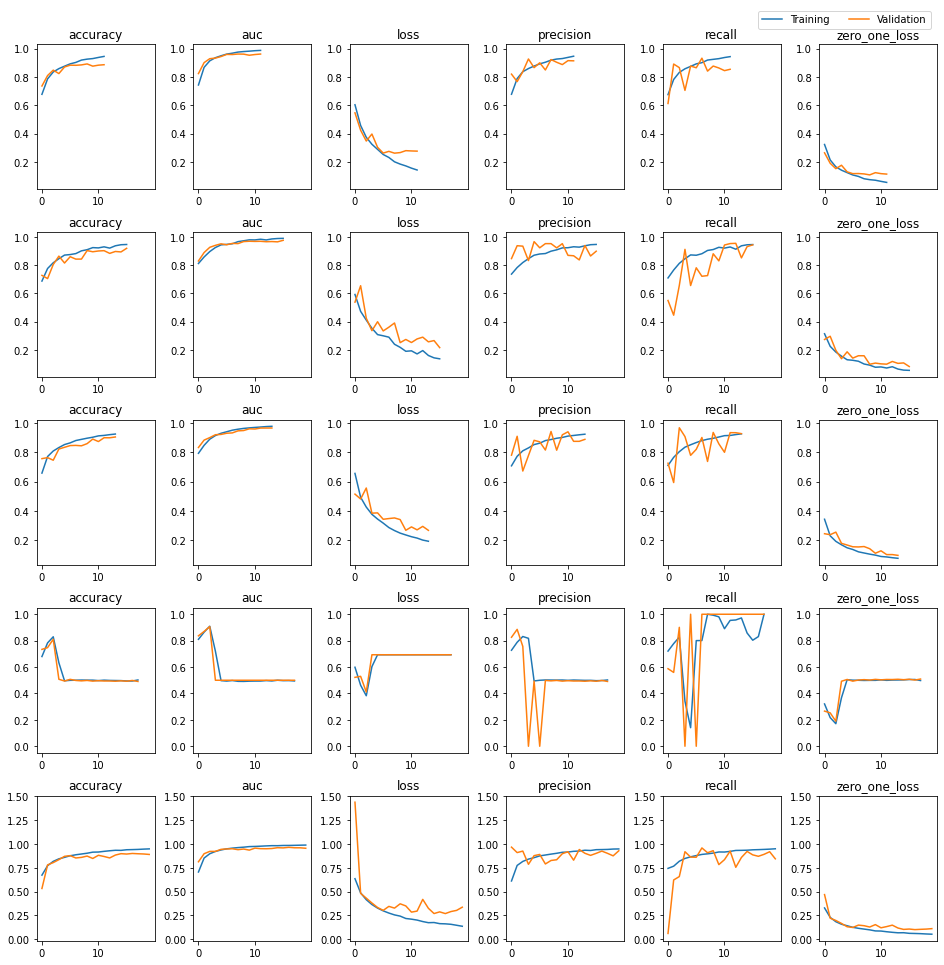

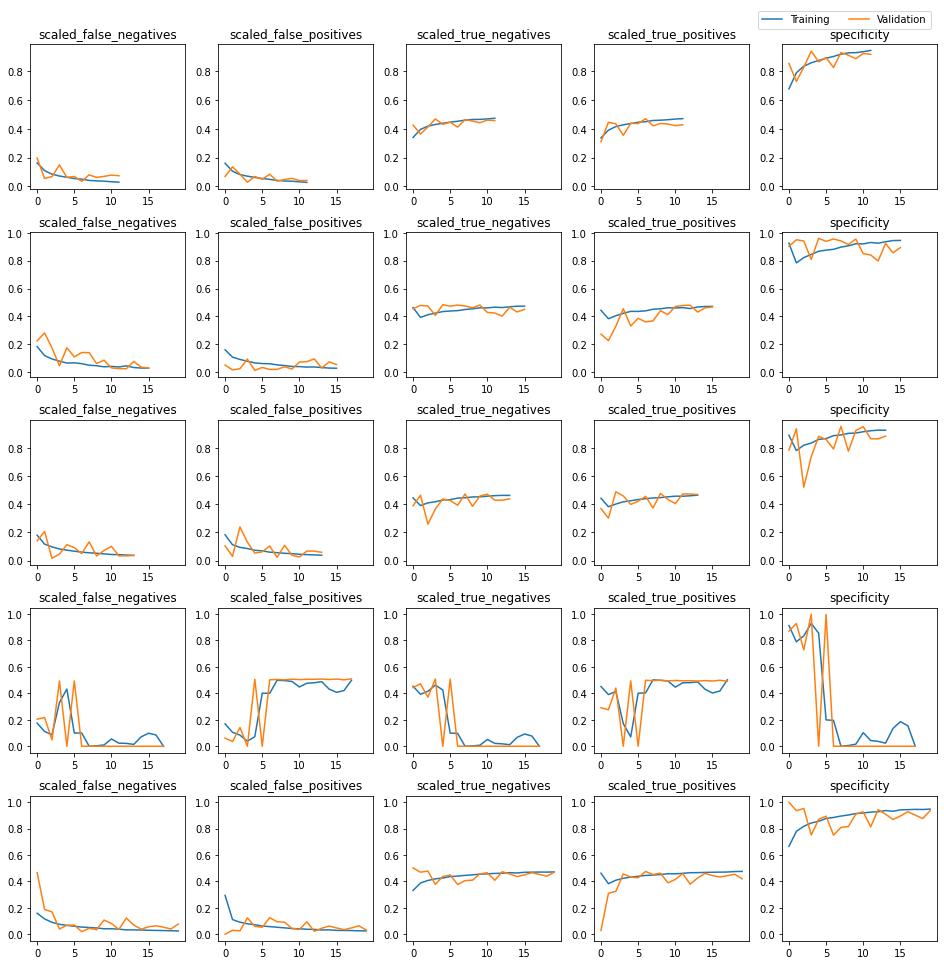

K-fold graphs for ReetaNet, RGB dataset


### RGB Augmented Dataset

#### K-fold results

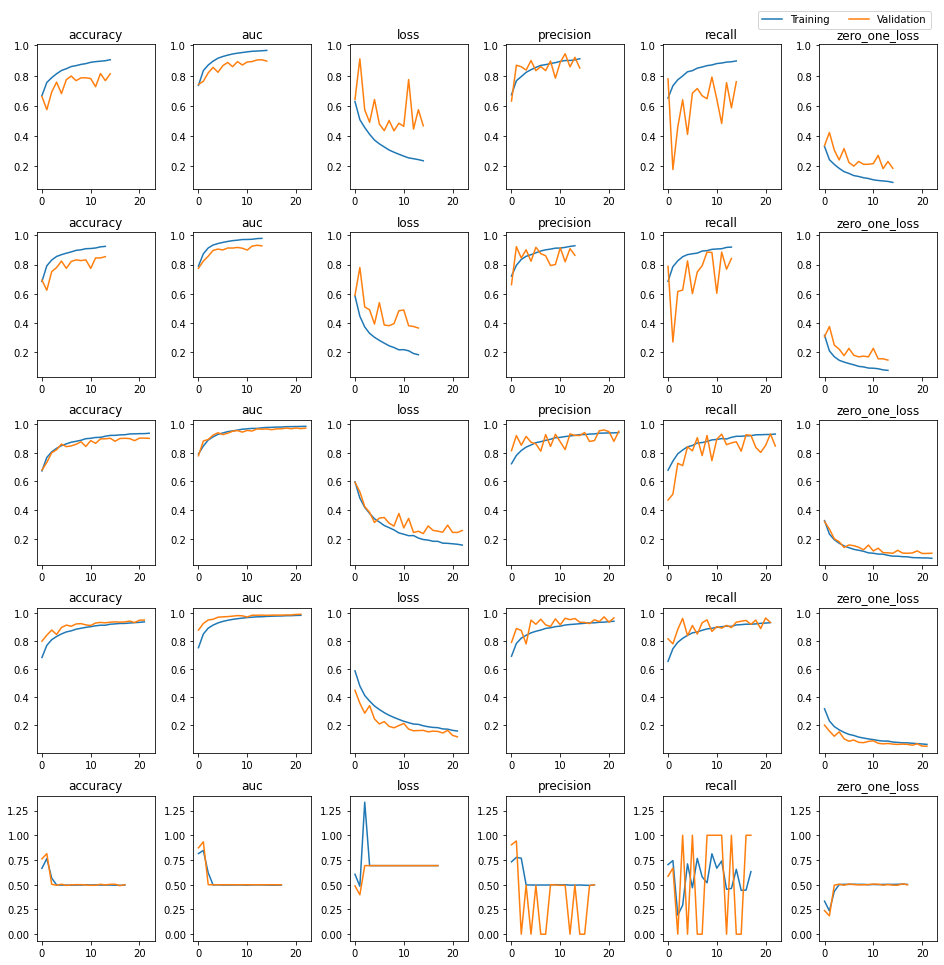

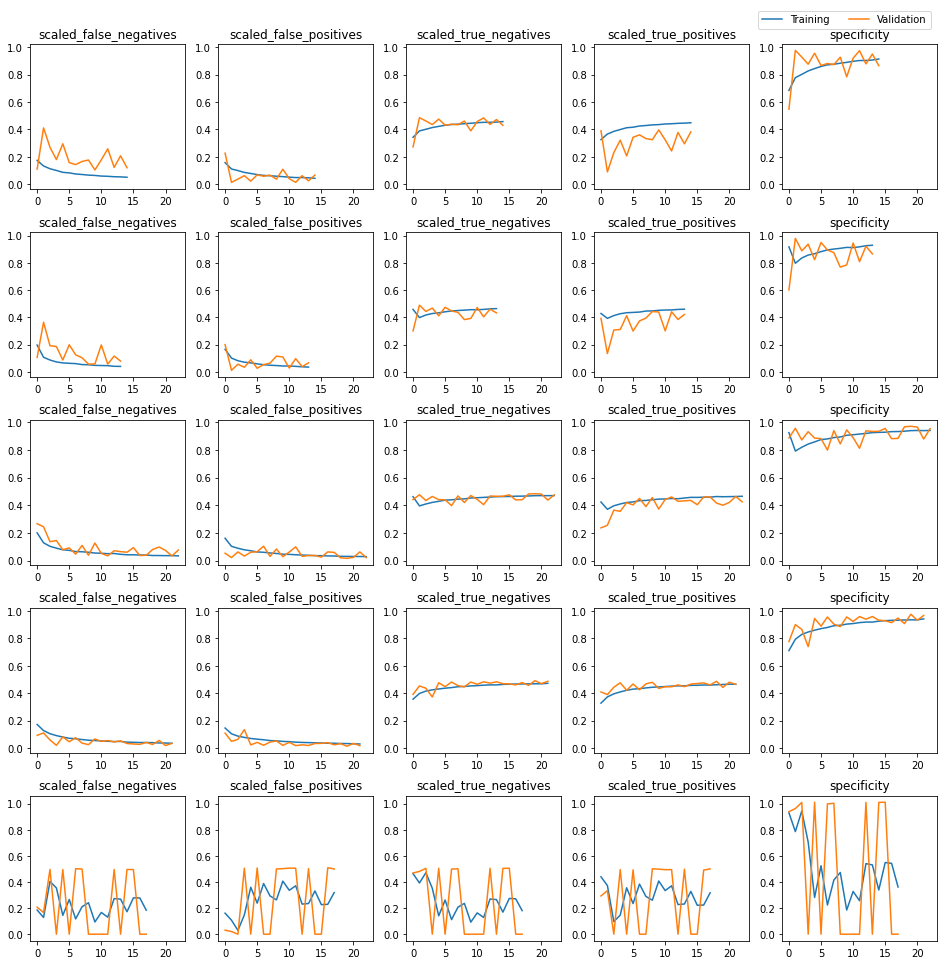

K-fold graphs for ReetaNet, RGB Augmented dataset


### Greyscale Dataset

#### K-fold results

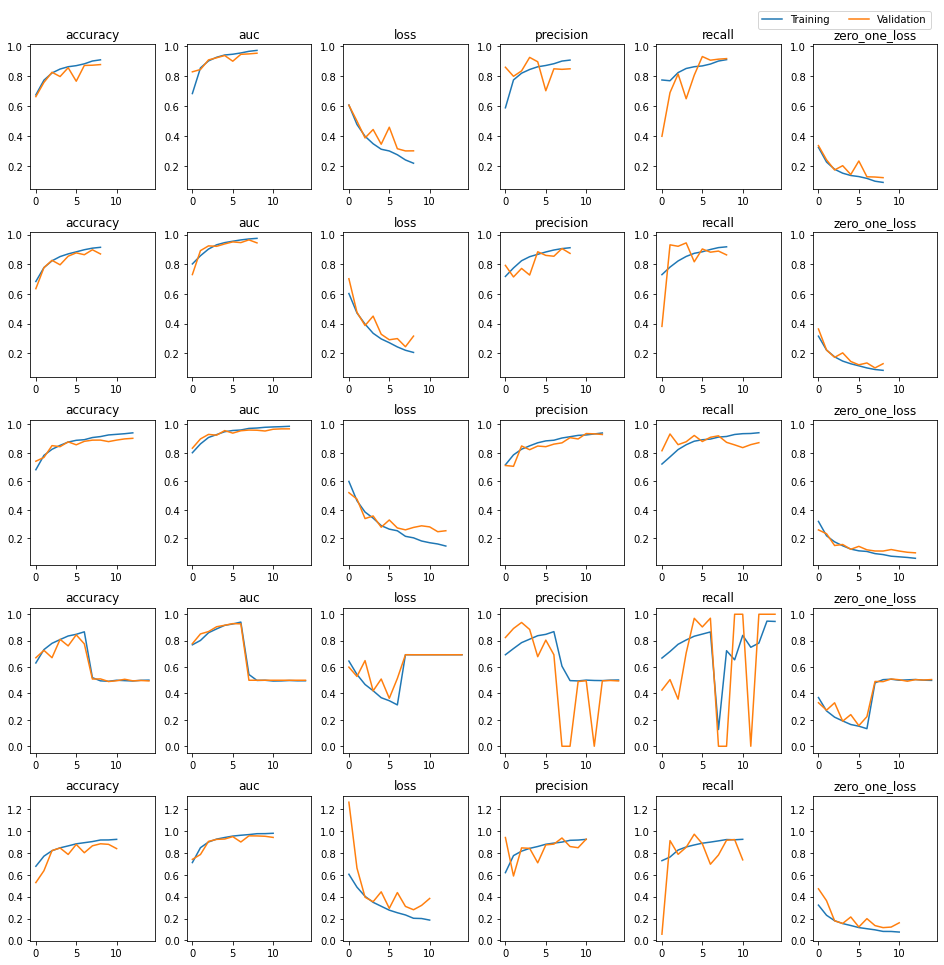

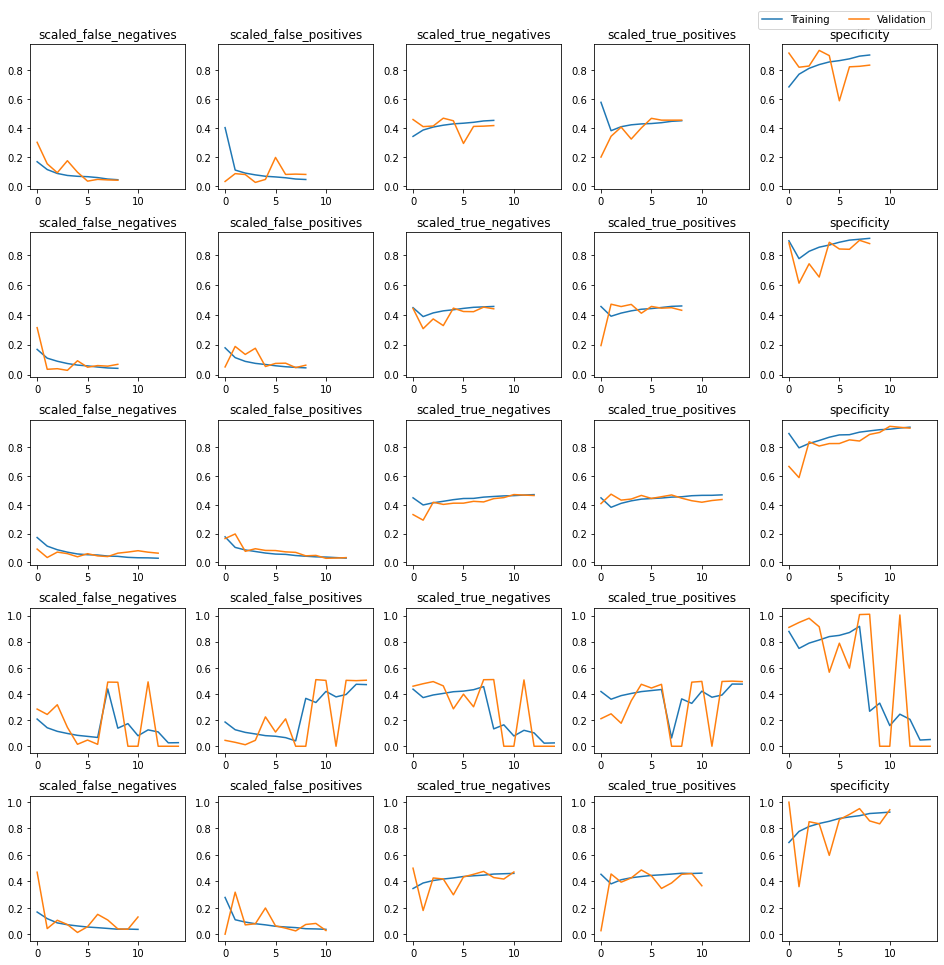

K-fold graphs for ReetaNet, Greyscale dataset


### Greyscale Augmented Dataset

#### K-fold results

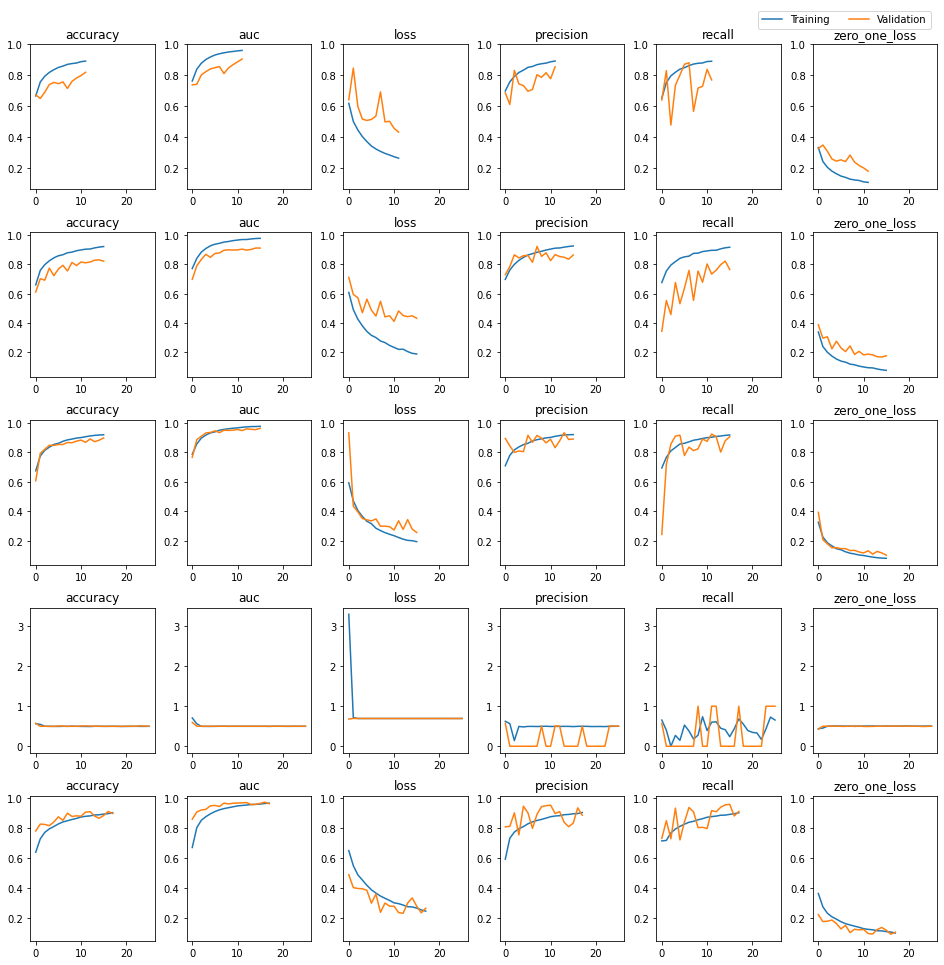

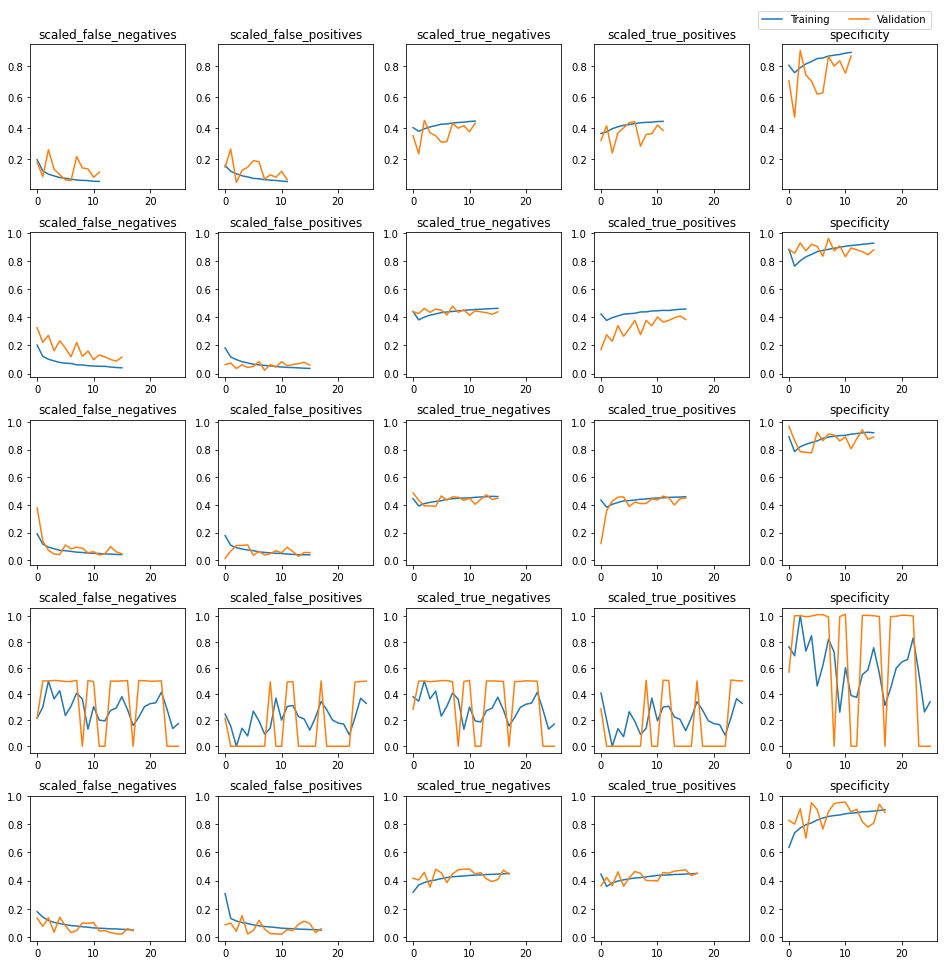

K-fold graphs for ReetaNet, Greyscale Augmented dataset


## VGGNetLike

### RGB Dataset

#### K-fold results

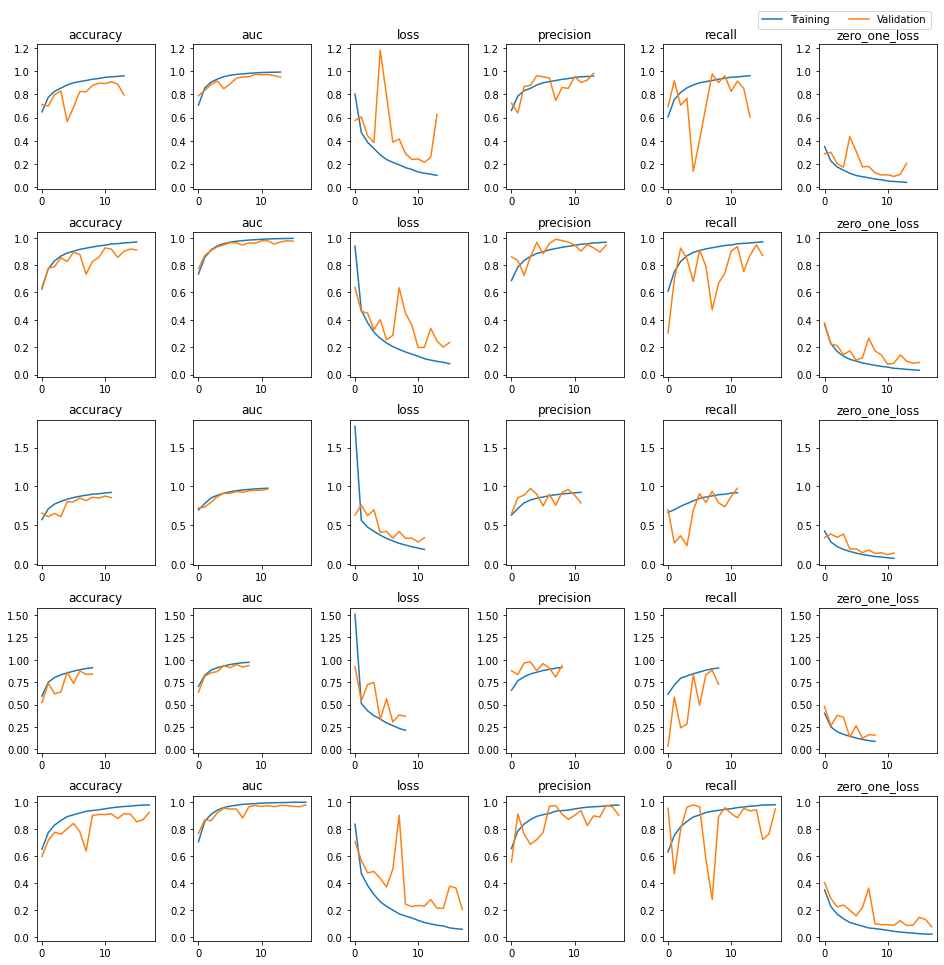

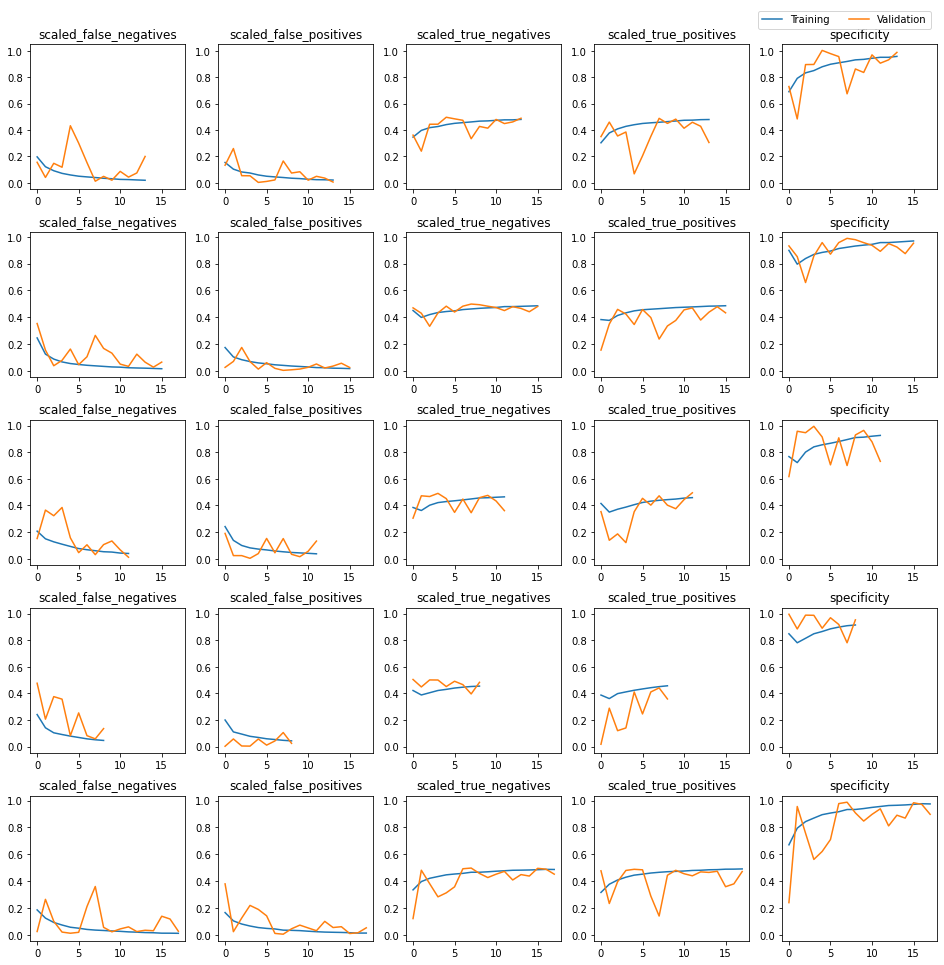

K-fold graphs for VGGNetLike, RGB dataset


### RGB Augmented Dataset

#### K-fold results

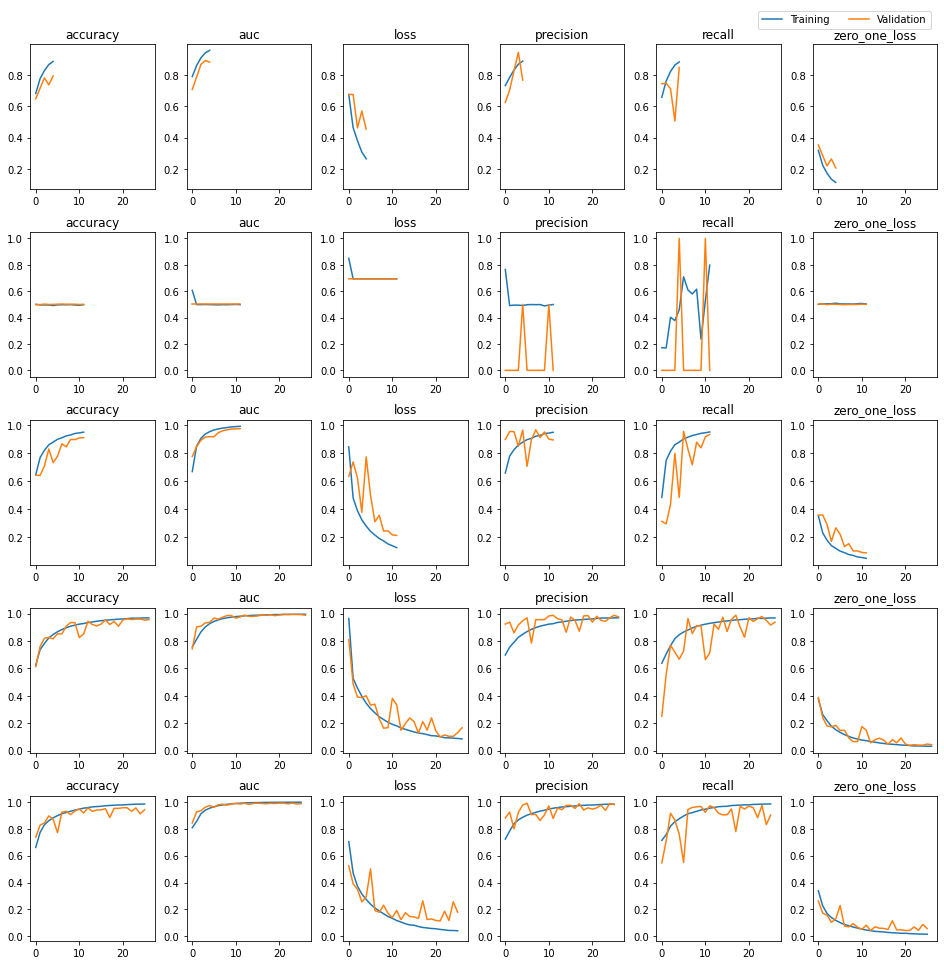

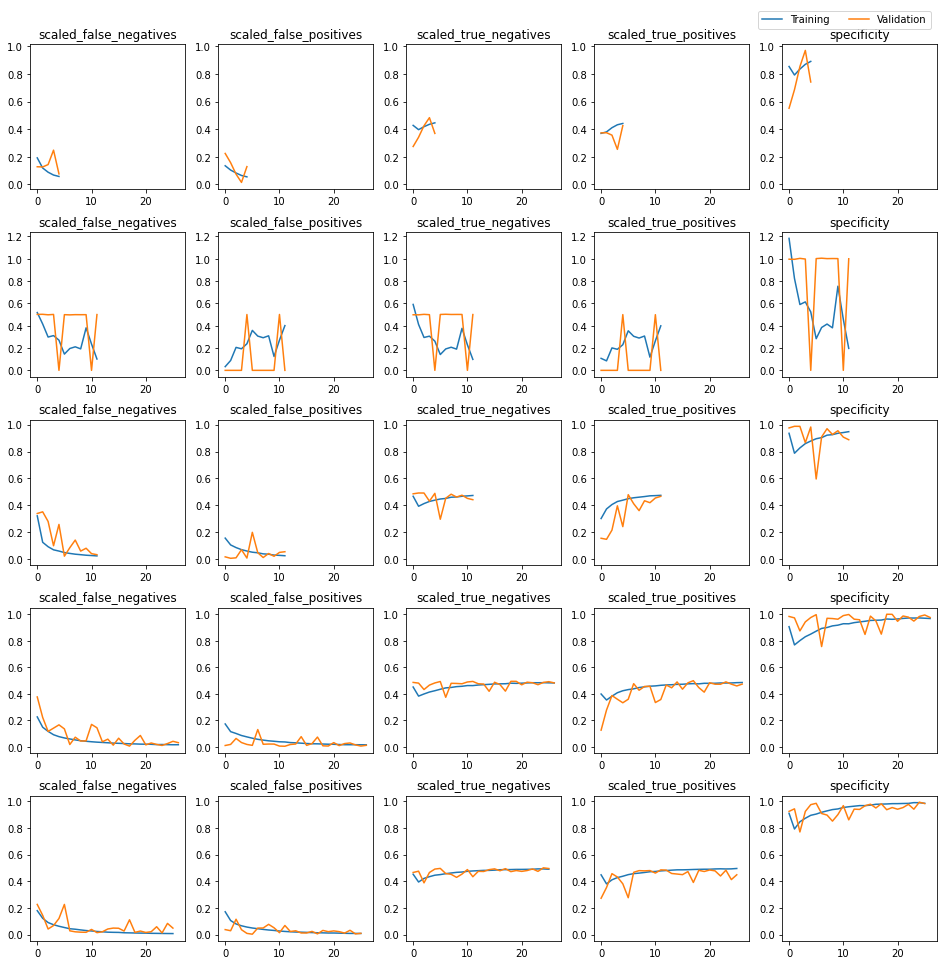

K-fold graphs for VGGNetLike, RGB Augmented dataset


### Greyscale Dataset

#### K-fold results

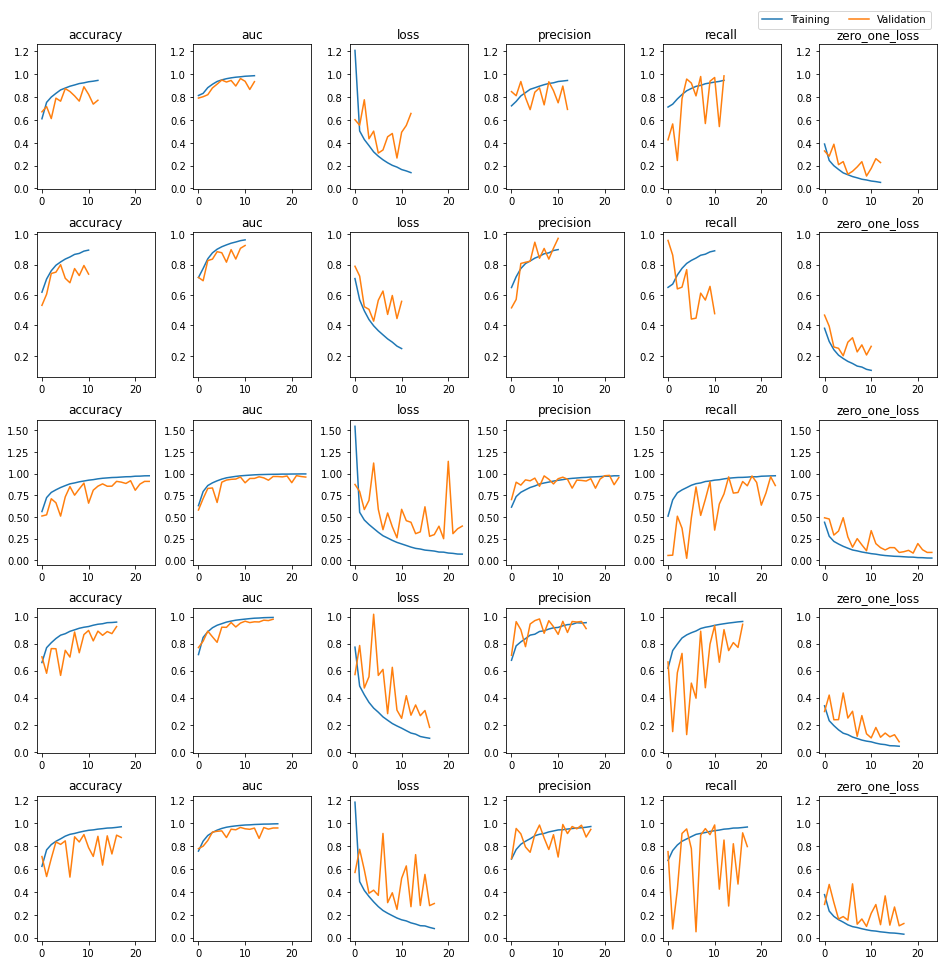

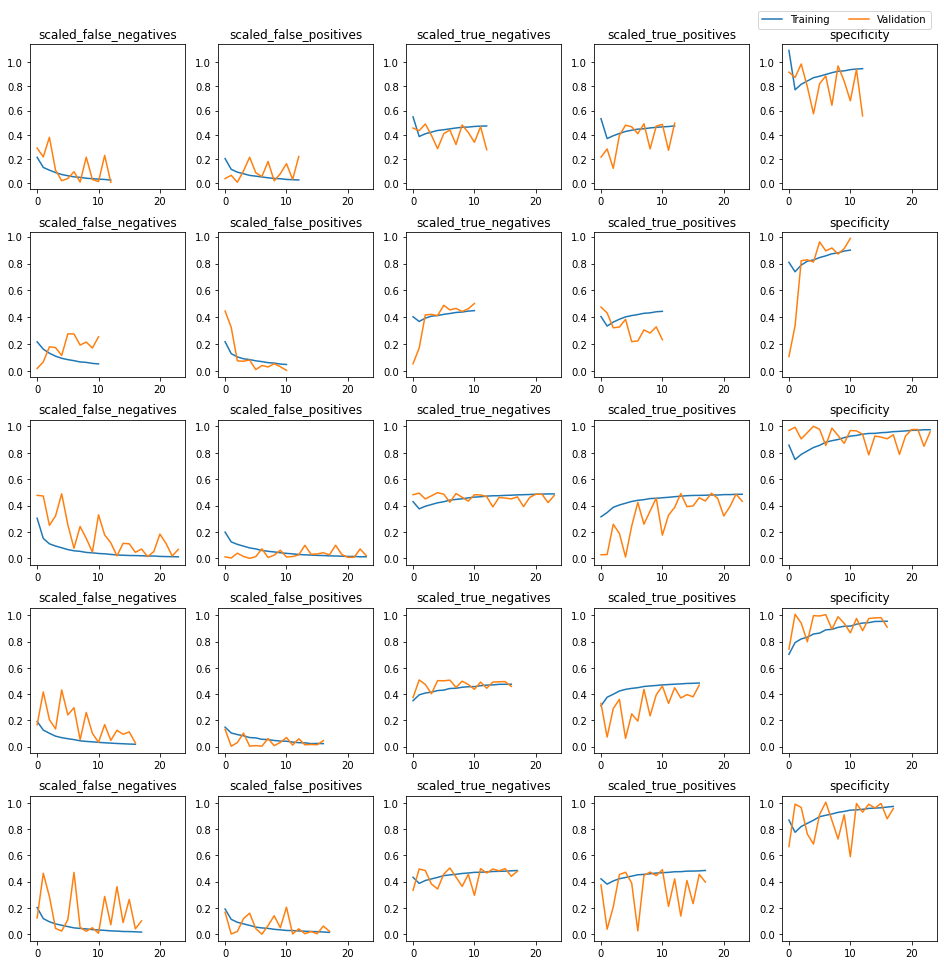

K-fold graphs for VGGNetLike, Greyscale dataset


### Greyscale Augmented Dataset

#### K-fold results

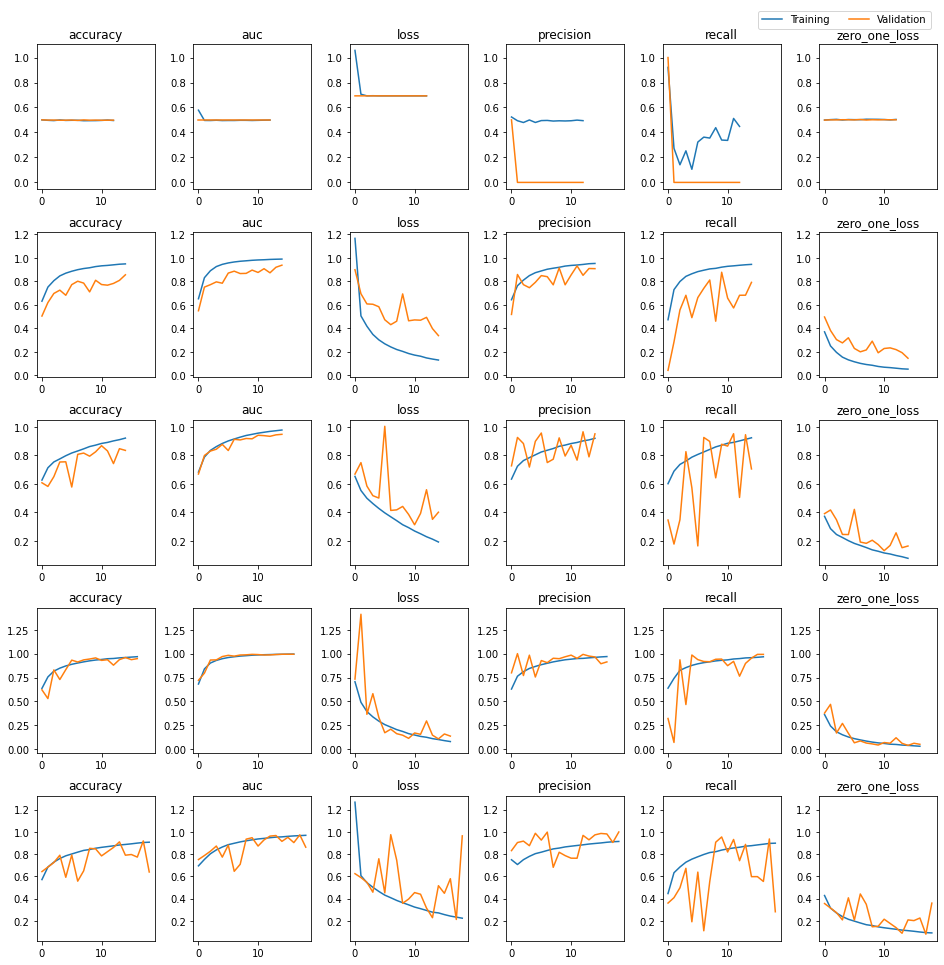

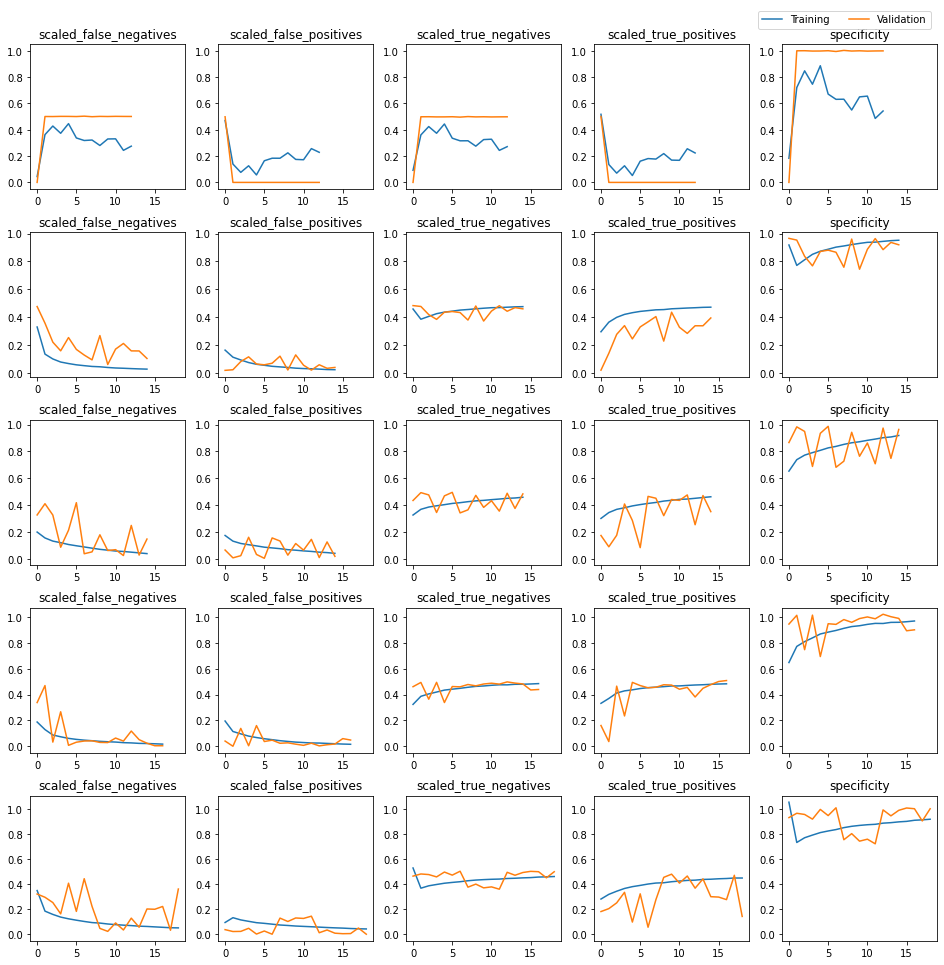

K-fold graphs for VGGNetLike, Greyscale Augmented dataset


In [ ]:
for model_name in ["ReetaNet", "VGGNetLike"]:
    display(Markdown(f"## {model_name}"))
    for dataset_name, dataset_path in [("RGB", "rgb"), ("RGB Augmented", "rgb_augmented"), ("Greyscale", "greyscale"), ("Greyscale Augmented", "greyscale_augmented")]:
        display(Markdown(f"### {dataset_name} Dataset"))

        try:
            display(Markdown(f"#### K-fold results"))
            results_filepath = os.path.join(
                BASE_DIR, f"{model_name.lower()}_kfold_{dataset_path}_dataset_results", "kfold_results.json")
            with open(results_filepath, "r") as in_file:
                kfold_results = json.load(in_file)

            keys = ["accuracy", "auc", "loss",
                    "precision", "recall", "zero_one_loss"]
            plot_results(kfold_results, keys=keys)

            # Normalize values for false/true positives/negatives and compute specificity
            keys_scaled = ["false_negatives", "false_positives", "true_negatives", "true_positives"]
            keys_negatives = ["false_positives", "true_negatives"]
            for iteration in kfold_results["iterations"].values():
                scaled = {f"scaled_{key}": iteration["history"][key] for key in keys_scaled}
                total = sum([elem[-1] for elem in scaled.values()])
                scaled = {key: list(map(lambda value: value / total, scaled[key])) for key in scaled}
                negatives = [iteration["history"][key][-1] for key in keys_negatives]
                negatives = sum(negatives)
                specificity = *map(lambda item: item / negatives, iteration["history"]["true_negatives"]),
                scaled["specificity"] = specificity
                iteration["history"].update(scaled)

                scaled = {f"val_scaled_{key}": iteration["history"][f"val_{key}"] for key in keys_scaled}
                total = sum([elem[-1] for elem in scaled.values()])
                scaled = {key: list(map(lambda value: value / total, scaled[key])) for key in scaled}
                negatives = [iteration["history"][f"val_{key}"][-1] for key in keys_negatives]
                negatives = sum(negatives)
                specificity = *map(lambda item: item / negatives, iteration["history"]["val_true_negatives"]),
                scaled["val_specificity"] = specificity
                iteration["history"].update(scaled)            
            keys_scaled = list(map(lambda key: f"scaled_{key}", keys_scaled)) + ["specificity"]
            plot_results(kfold_results, keys=keys_scaled)

            plt.show()
            print(
                f"K-fold graphs for {model_name}, {dataset_name} dataset")
        except:
            print(f"No k-fold data for {model_name}, {dataset_name}")



# Visualization

In [ ]:
custom_objects = {metric.name: metric for metric in metrics}

In [ ]:
pairs = read_into_datasets(dataset_rgb_paths[0], seed=75).take(1000)
samples, labels = zip(*pairs)
samples = *map(lambda item: item.numpy(), samples),


Found 24932 files belonging to 2 classes.


## ReetaNet

In [ ]:
reetanet_model = tf.keras.models.load_model(
    os.path.join(
        BASE_DIR,
        "reetanet_kfold_rgb_augmented_dataset_results",
        "ReetaNet_iteration_3.tf"
    ),
    custom_objects=custom_objects
)


In [ ]:
reetanet_model.summary()


Model: "ReetaNet_iteration_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_0 (Conv2D)           (None, 128, 128, 16)      448       
                                                                 
 MaxPooling2D_0 (MaxPooling2  (None, 64, 64, 16)       0         
 D)                                                              
                                                                 
 BatchNormalization_0 (Batch  (None, 64, 64, 16)       64        
 Normalization)                                                  
                                                                 
 Activation_0 (Activation)   (None, 64, 64, 16)        0         
                                                                 
 Conv2D_1 (Conv2D)           (None, 64, 64, 32)        4640      
                                                                 
 MaxPooling2D_1 (MaxPooling2  (None, 32, 32, 3

Conv2D_0 (1, 128, 128, 16) 


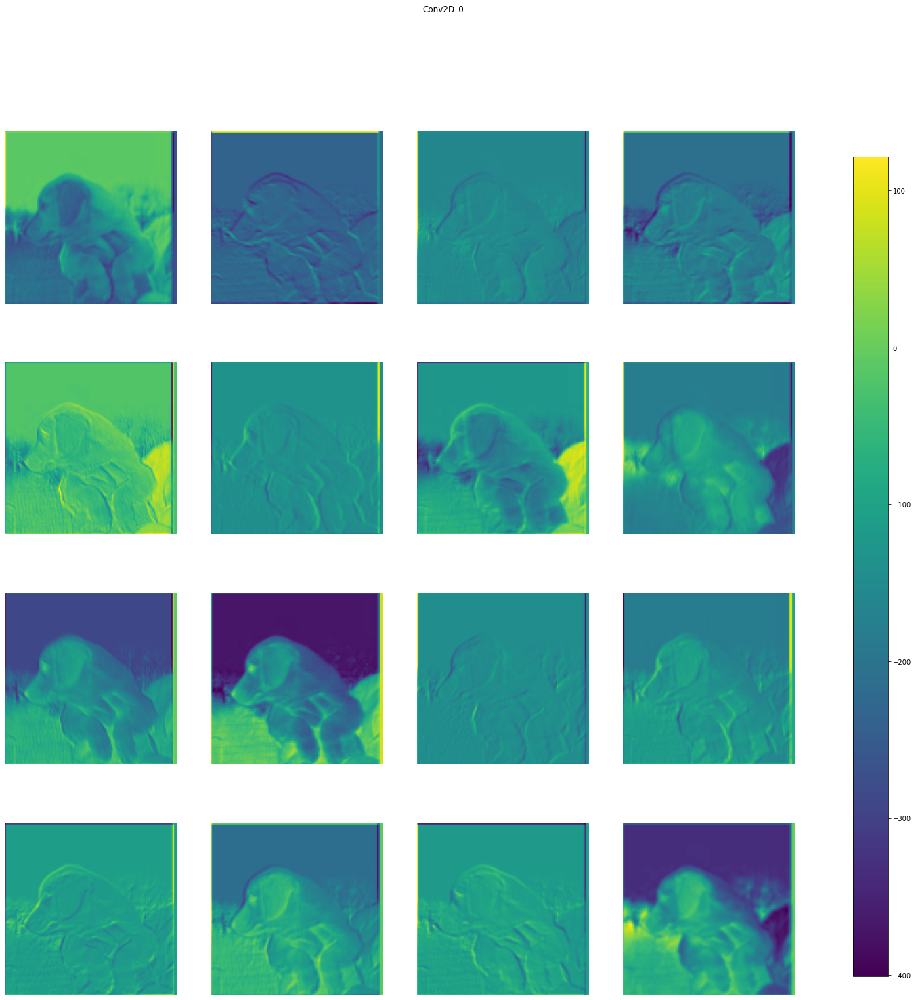

MaxPooling2D_0 (1, 64, 64, 16) 


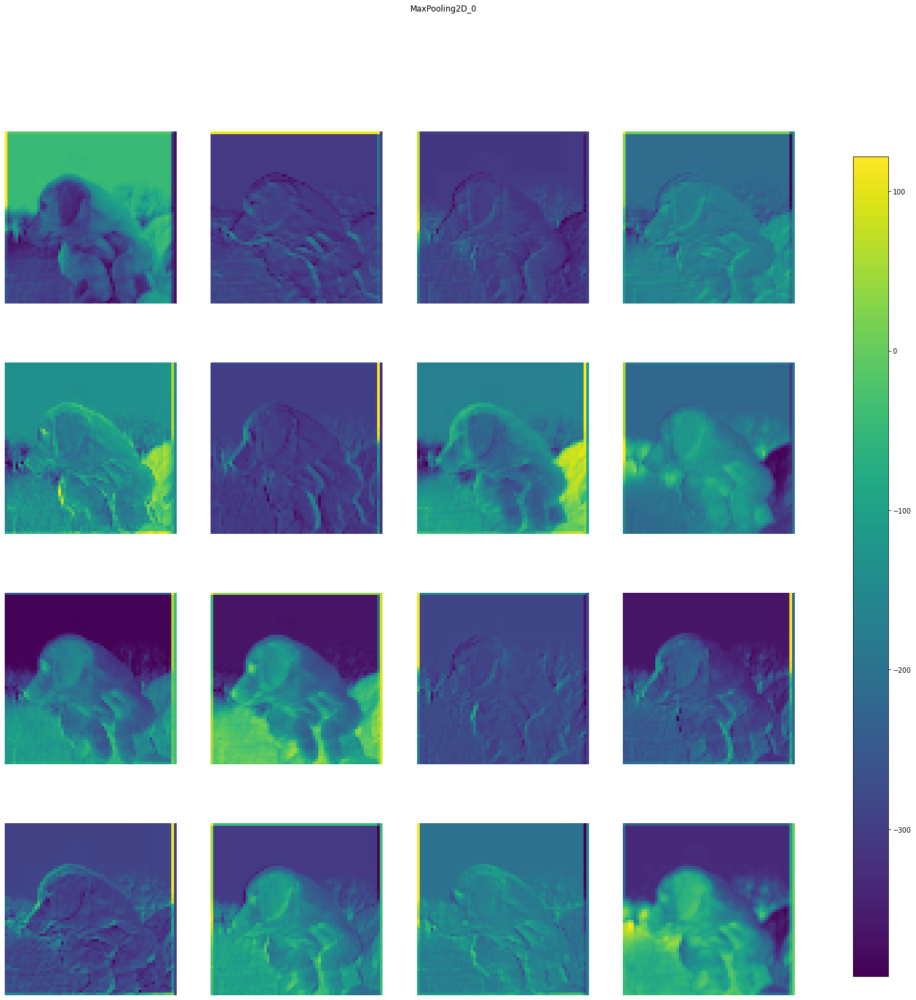

Activation_0 (1, 64, 64, 16) 


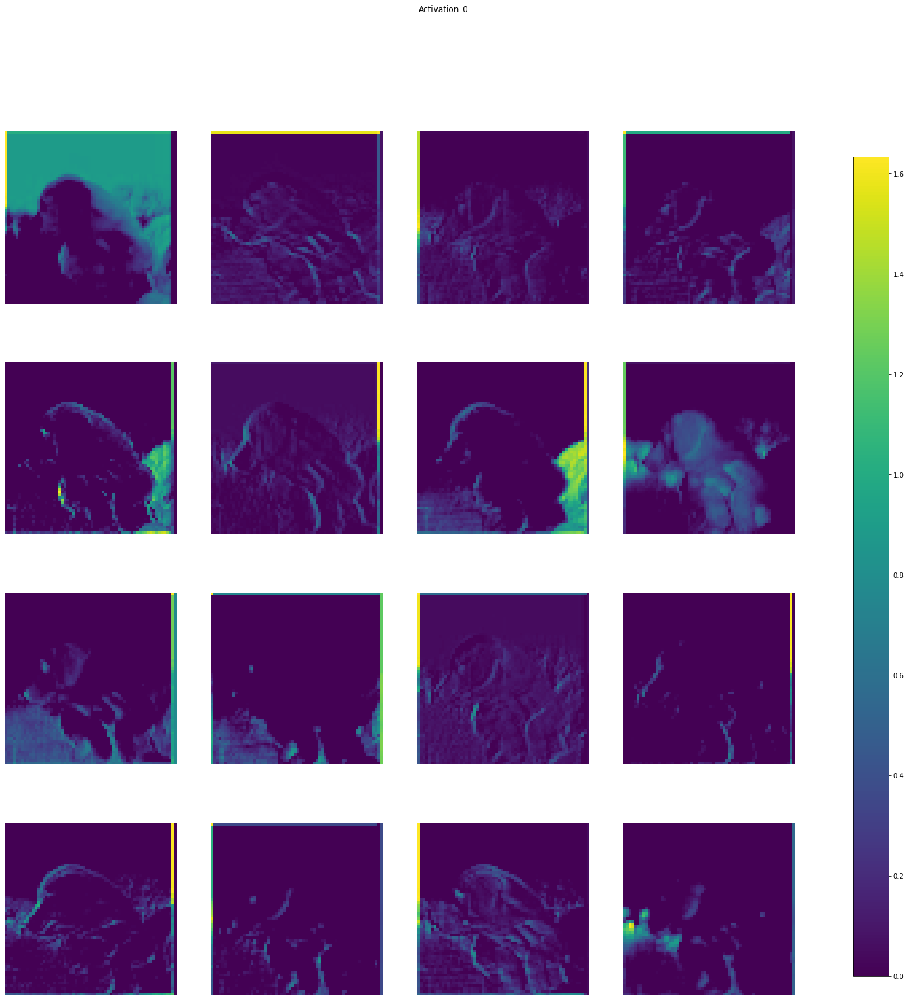

Conv2D_1 (1, 64, 64, 32) 


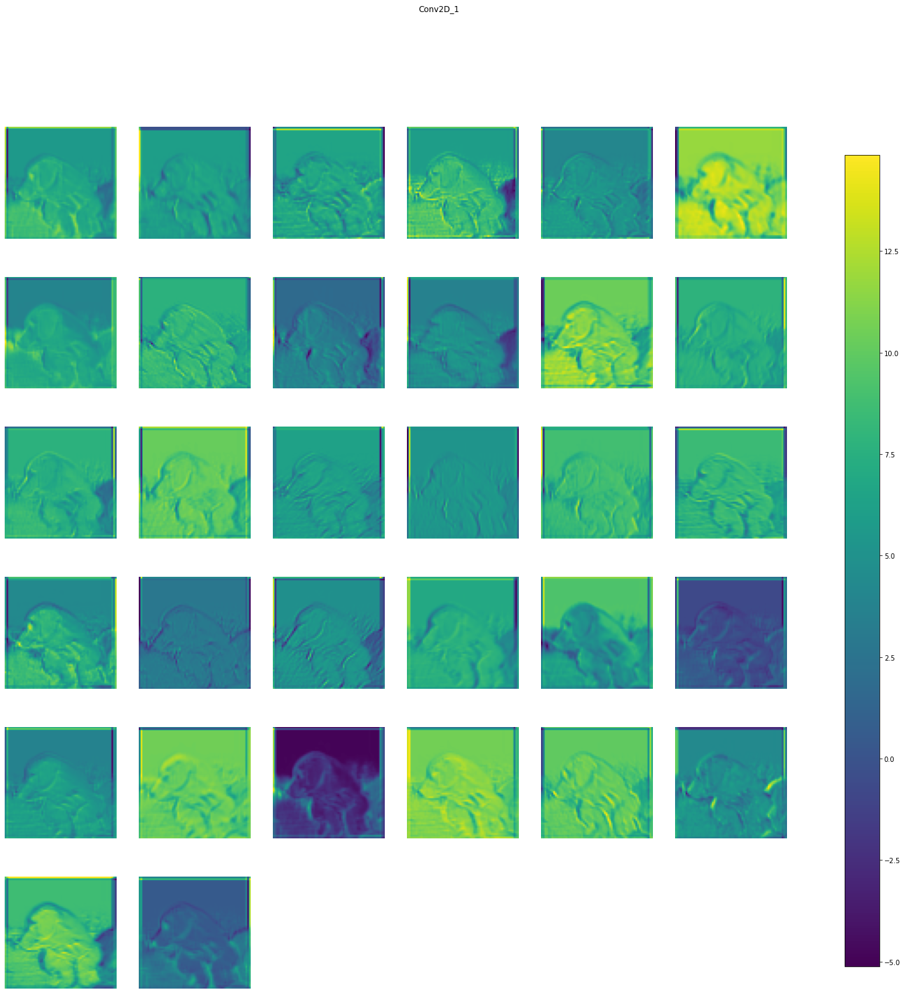

MaxPooling2D_1 (1, 32, 32, 32) 


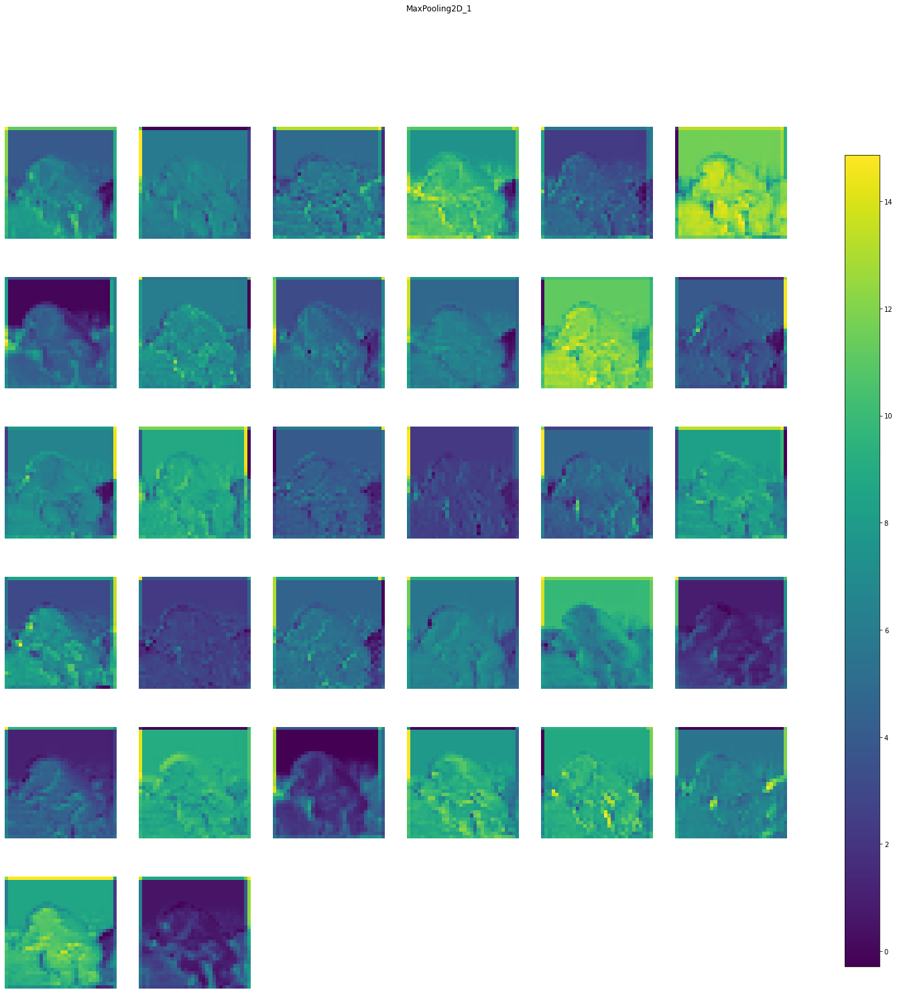

Conv2D_2 (1, 32, 32, 64) 


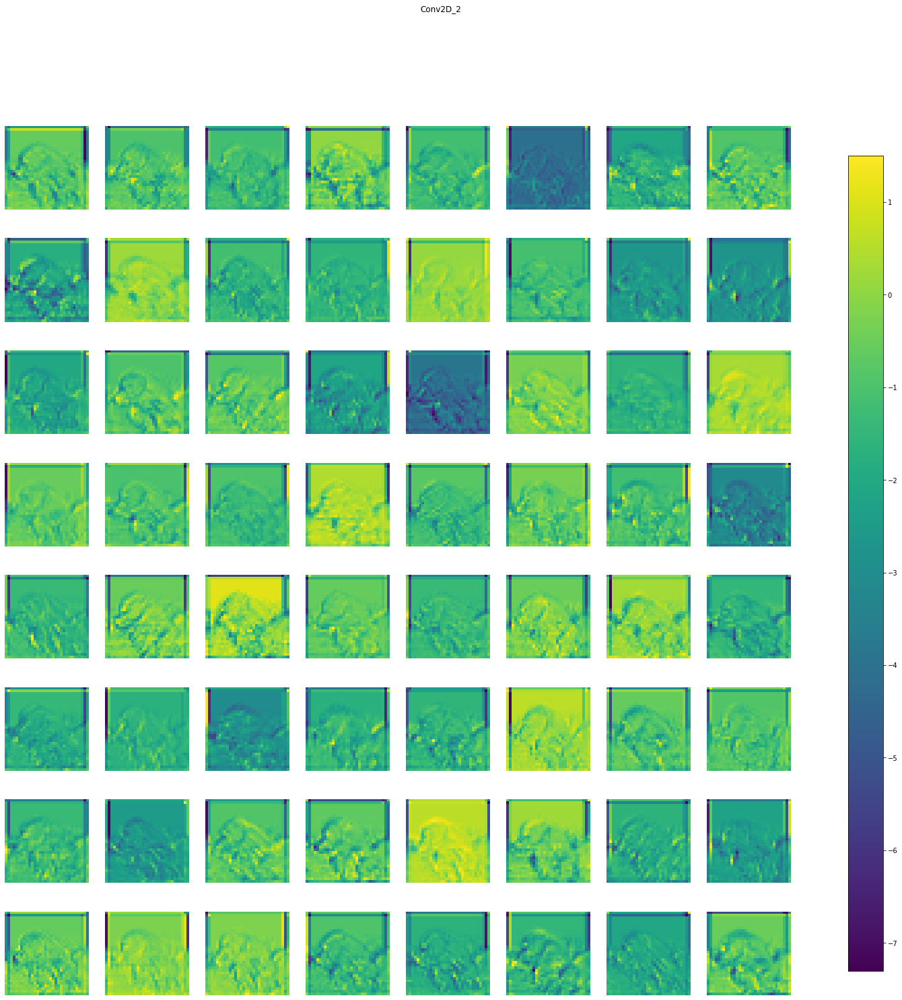

MaxPooling2D_2 (1, 16, 16, 64) 


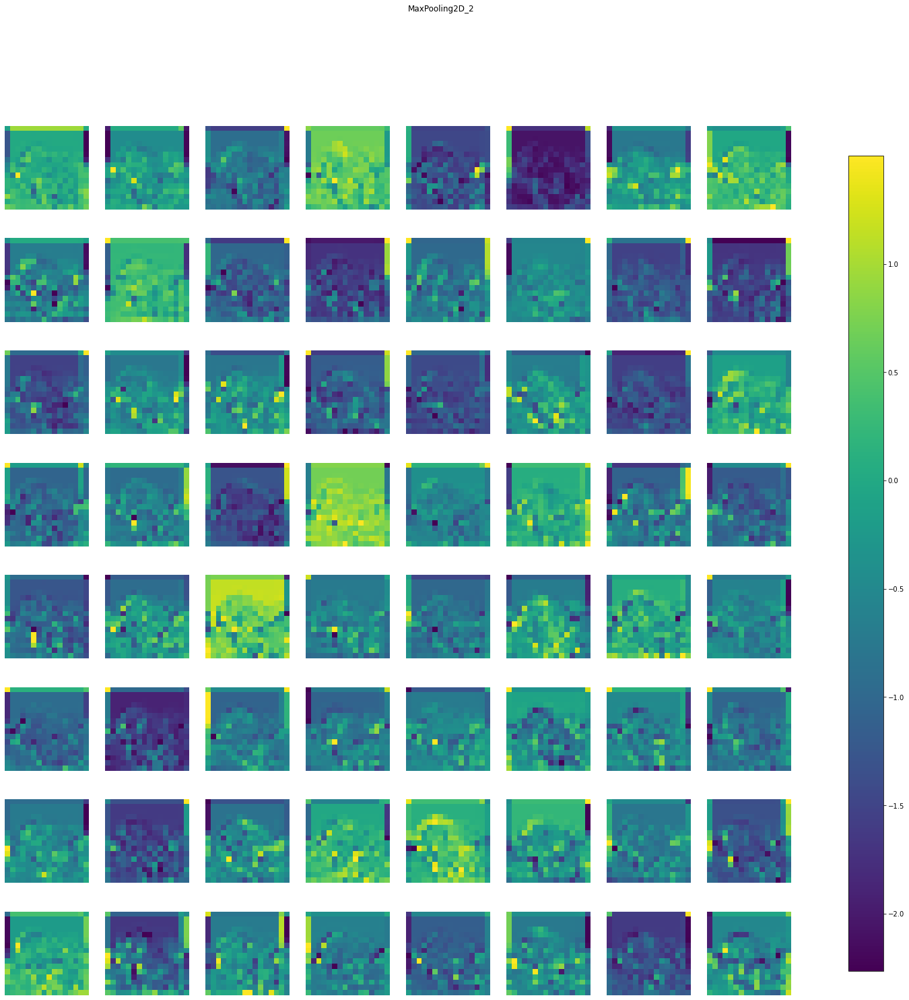

Dropout_0 (1, 16, 16, 64) 


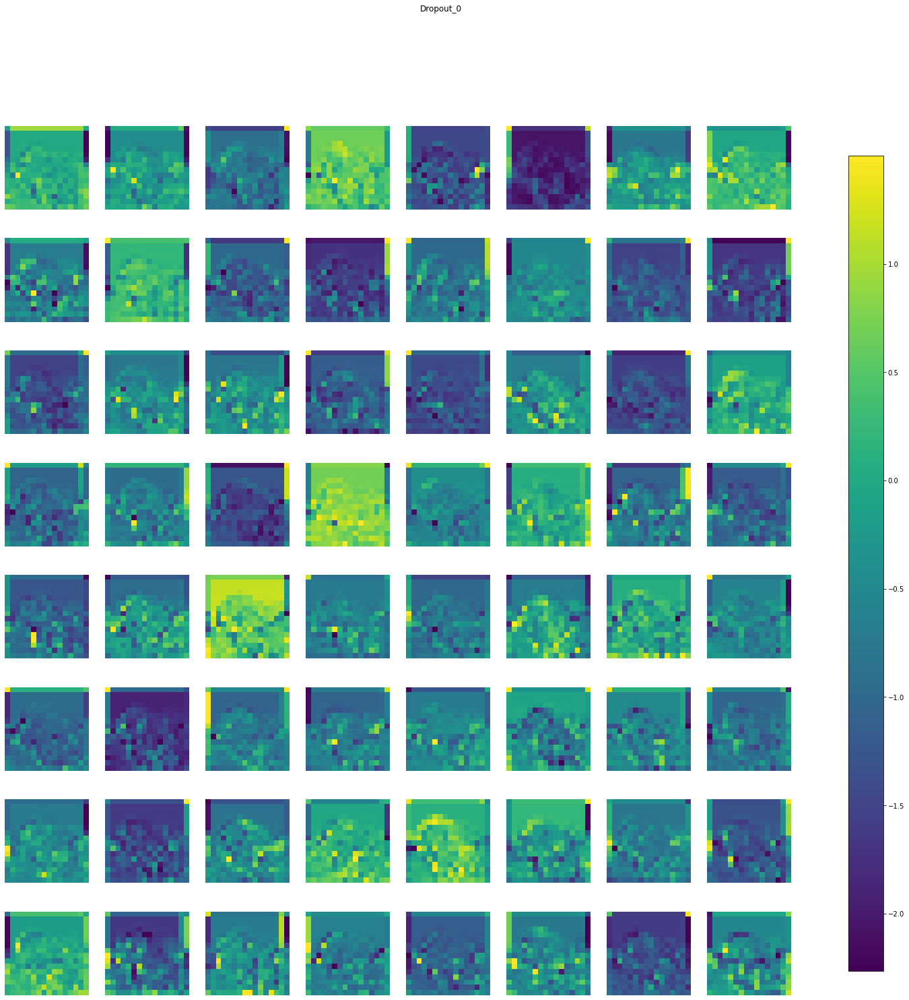

Conv2D_3 (1, 16, 16, 128) 


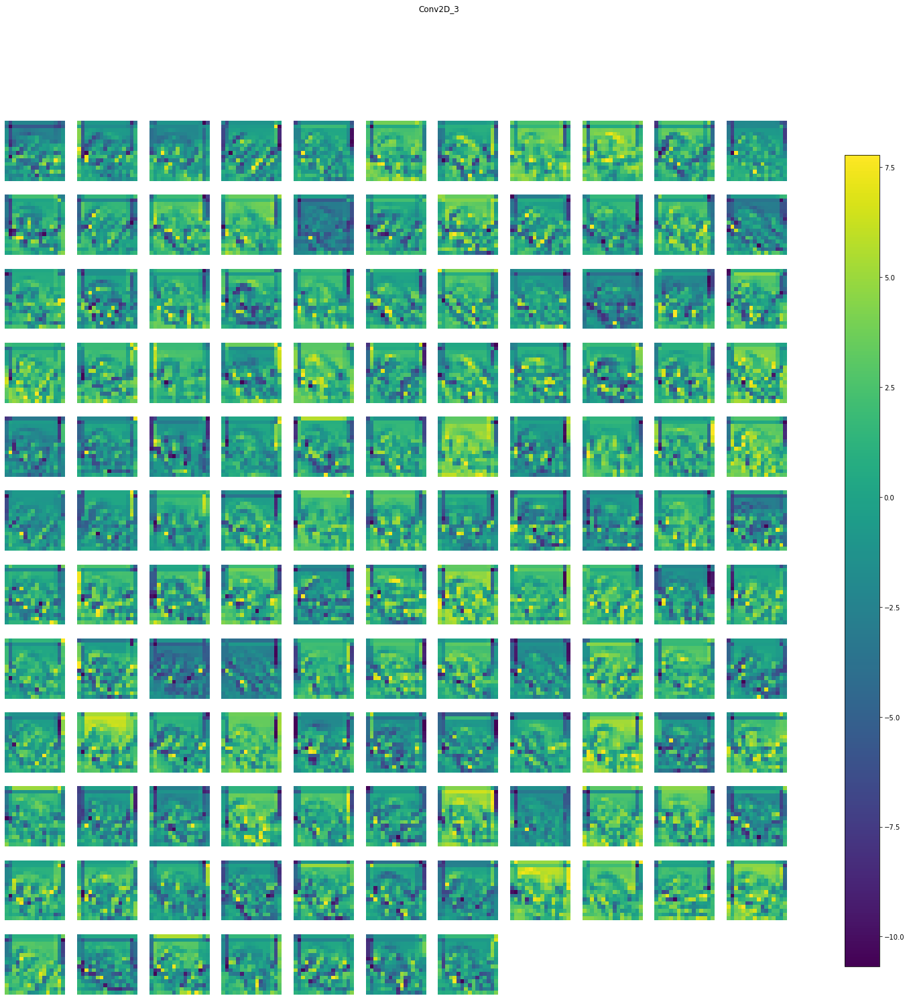

MaxPooling2D_3 (1, 8, 8, 128) 


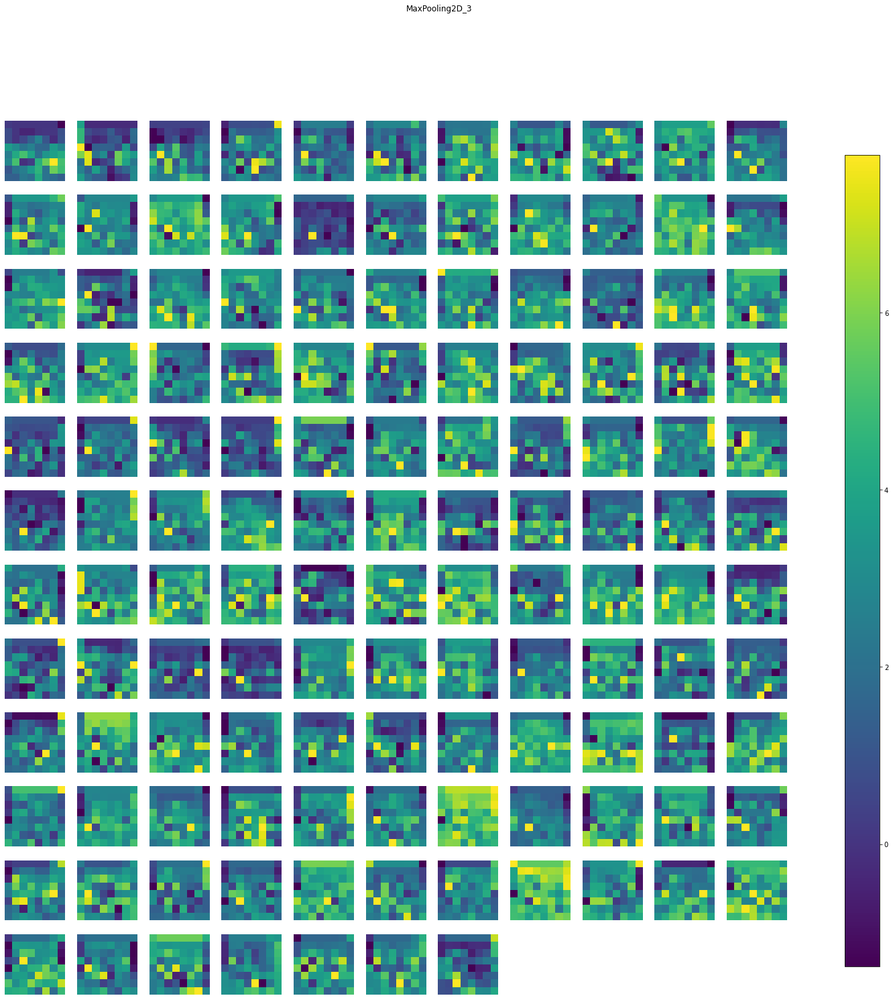

Conv2D_4 (1, 8, 8, 128) 


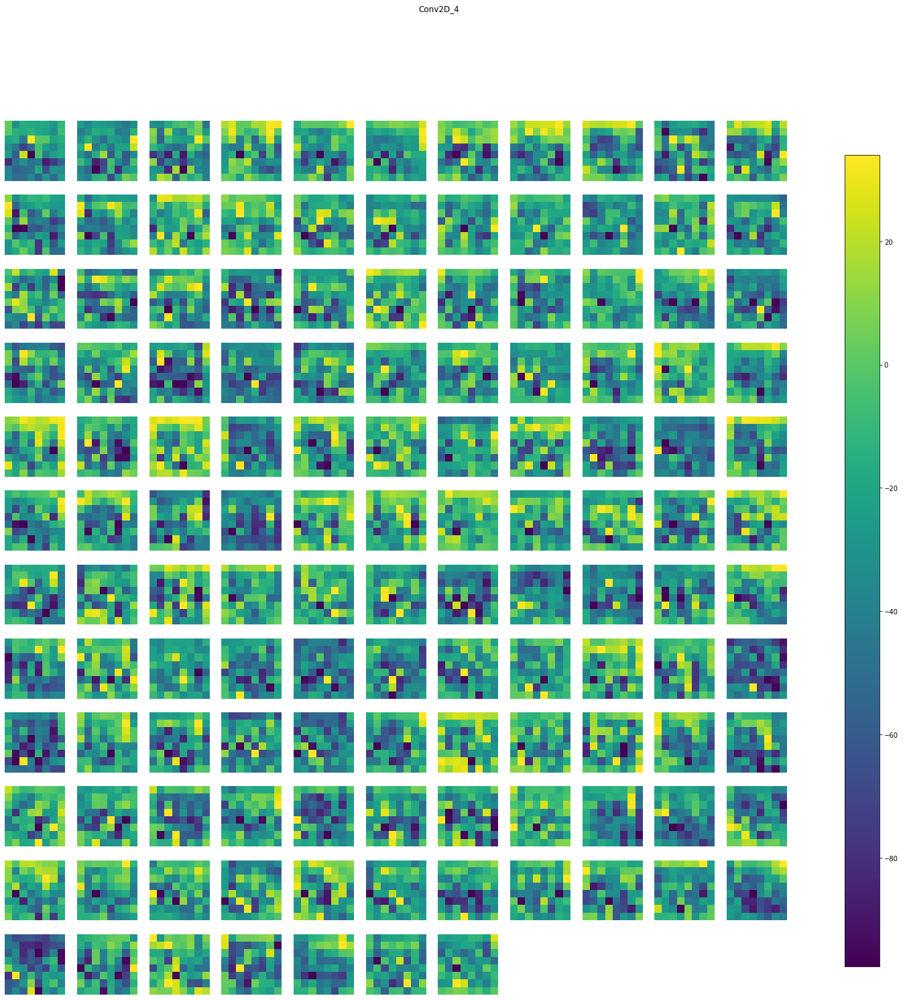

MaxPooling2D_4 (1, 4, 4, 128) 


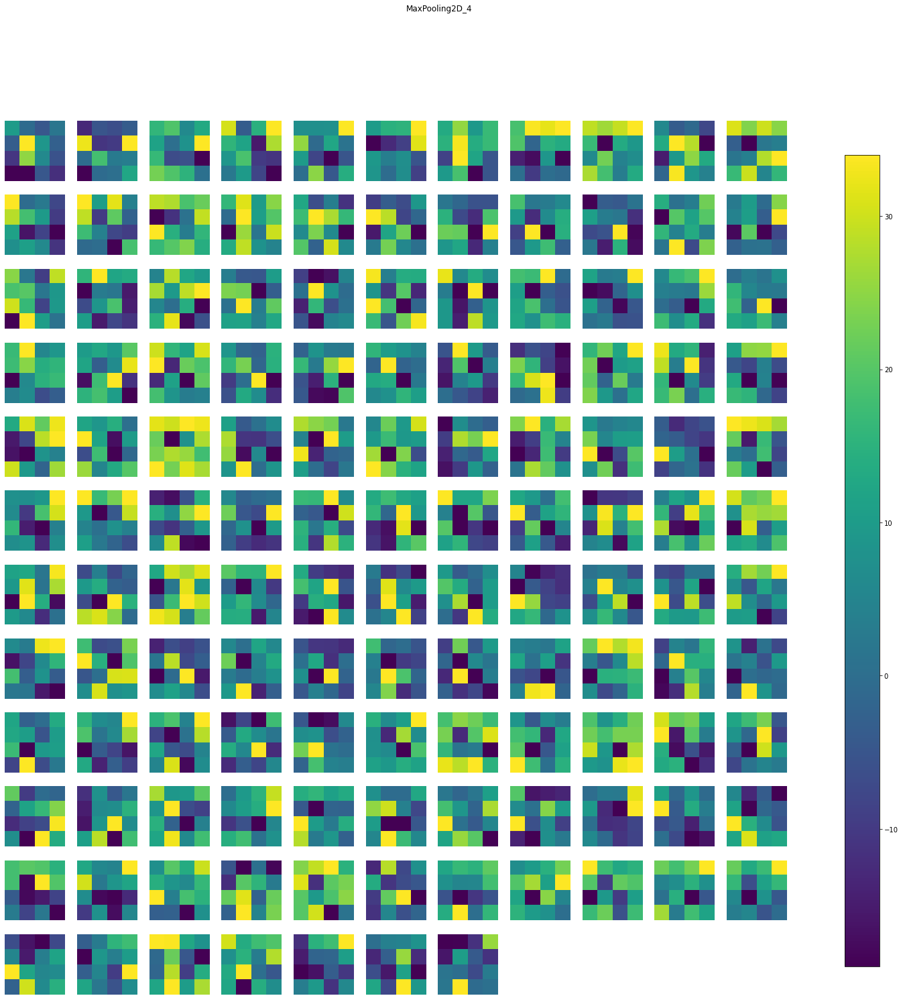

Flatten (1, 2048) 


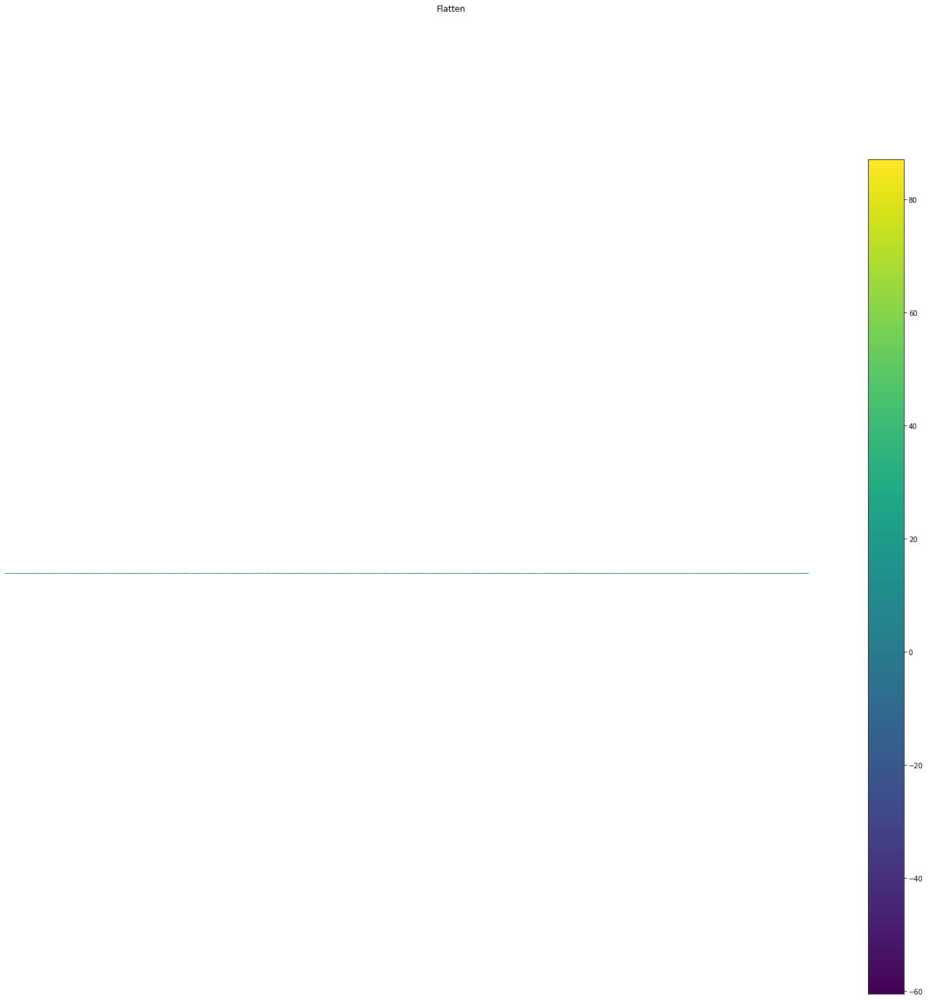

DenseResult (1, 1) 


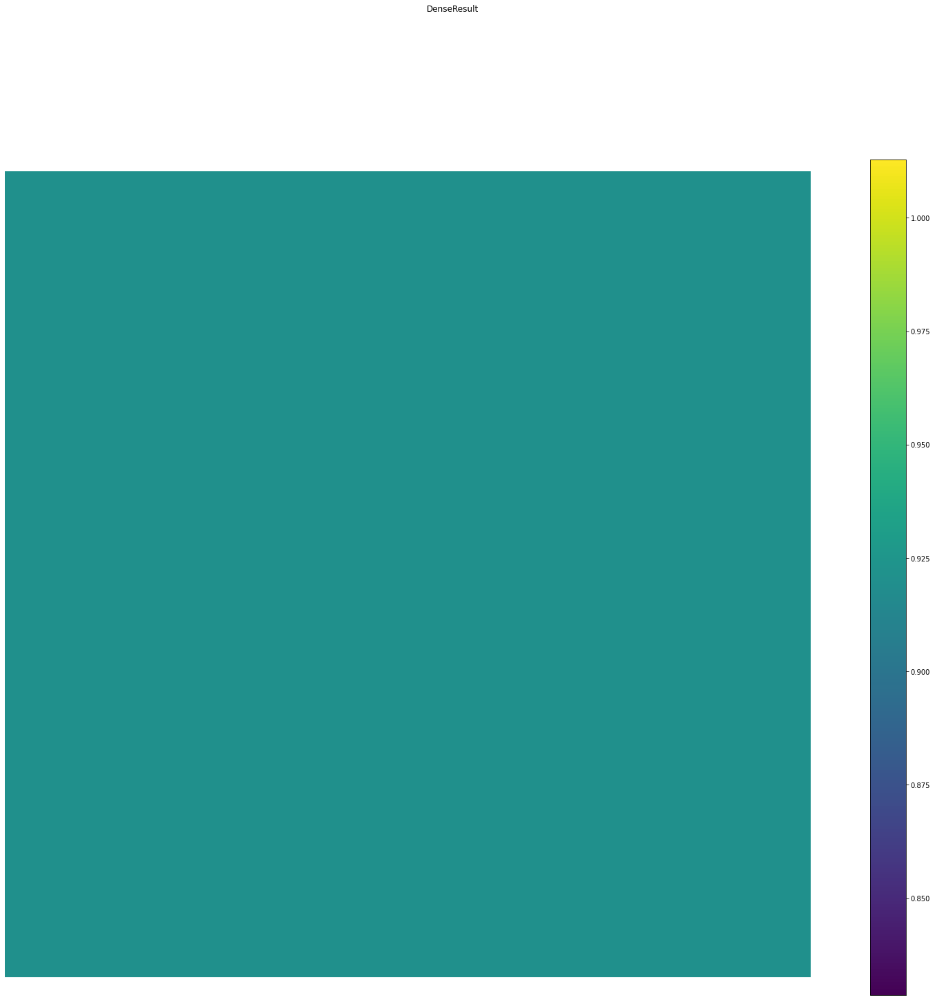

In [ ]:
# Fetch activations generated by the Keras model and an input im
layer_names = [
    "Conv2D_0_input",
    "Conv2D_0",
    "MaxPooling2D_0",
    "Conv2D_1",
    "MaxPooling2D_1",
    "Activation_0",
    "Conv2D_2",
    "MaxPooling2D_2",
    "Dropout_0",
    "Conv2D_3",
    "MaxPooling2D_3",
    "Conv2D_4",
    "MaxPooling2D_4",
    "Flatten",
    "DenseResult"
]
activations = get_activations(reetanet_model, samples[0][None, :], layer_names=layer_names)

# Show activation maps
display_activations(activations, save=False)


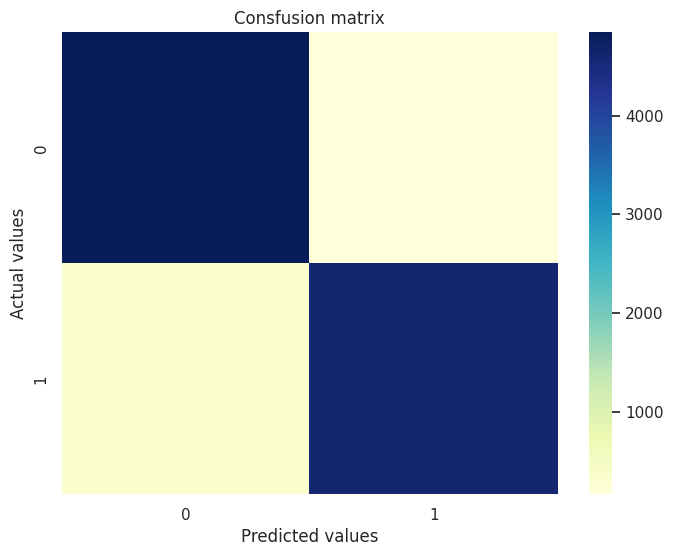

In [ ]:
results_filepath = os.path.join(
    BASE_DIR,
    f"reetanet_kfold_rgb_augmented_dataset_results",
    "kfold_results.json"
)
with open(results_filepath, "r") as in_file:
    kfold_results = json.load(in_file)

results = kfold_results["iterations"]["3"]["history"]
conf_mat = [
    [
        results["val_true_negatives"][-1],
        results["val_false_positives"][-1]
    ],
    [
        results["val_false_negatives"][-1],
        results["val_true_positives"][-1]
    ]
]

plt.figure(figsize=(8, 6))
sns.set_theme()

# Create the confusion matrix
ax = sns.heatmap(conf_mat, cmap="YlGnBu")
ax.set(title="Consfusion matrix", xlabel="Predicted values", ylabel="Actual values")
# Use this to "undo" sns.set() so that other functions creating graphs are unaffected
matplotlib.rc_file_defaults()

## VGGNetLike

In [ ]:
vggnetlike_model = tf.keras.models.load_model(
    os.path.join(
        BASE_DIR,
        "vggnetlike_kfold_rgb_augmented_dataset_results",
        "VGGNetLike_iteration_3.tf"
    ),
    custom_objects=custom_objects
)

In [ ]:
vggnetlike_model.summary()


Model: "VGGNetLike_iteration_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_0_0 (Conv2D)         (None, 128, 128, 32)      896       
                                                                 
 BatchNormalization_0_0 (Bat  (None, 128, 128, 32)     128       
 chNormalization)                                                
                                                                 
 Activation_0_0 (Activation)  (None, 128, 128, 32)     0         
                                                                 
 Dropout_0_0 (Dropout)       (None, 128, 128, 32)      0         
                                                                 
 MaxPooling2D_0 (MaxPooling2  (None, 64, 64, 32)       0         
 D)                                                              
                                                                 
 Conv2D_1_0 (Conv2D)         (None, 64, 64, 

MaxPooling2D_0 (1, 64, 64, 32) 


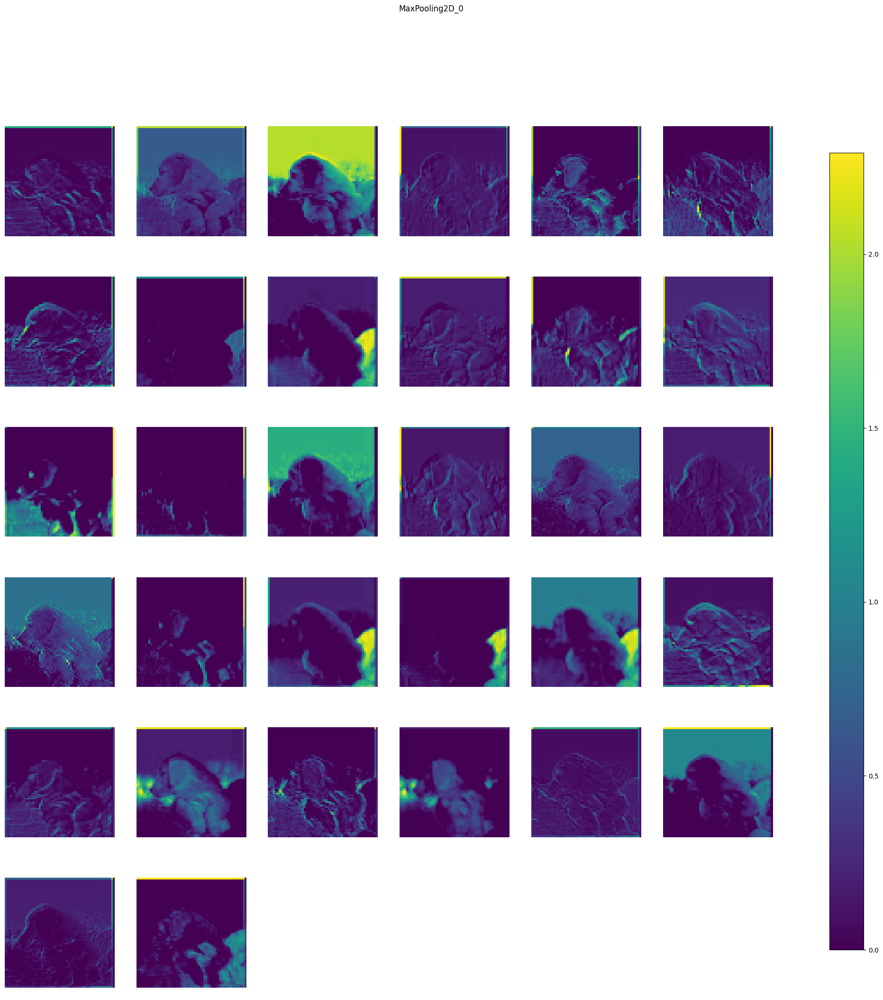

MaxPooling2D_1 (1, 32, 32, 64) 


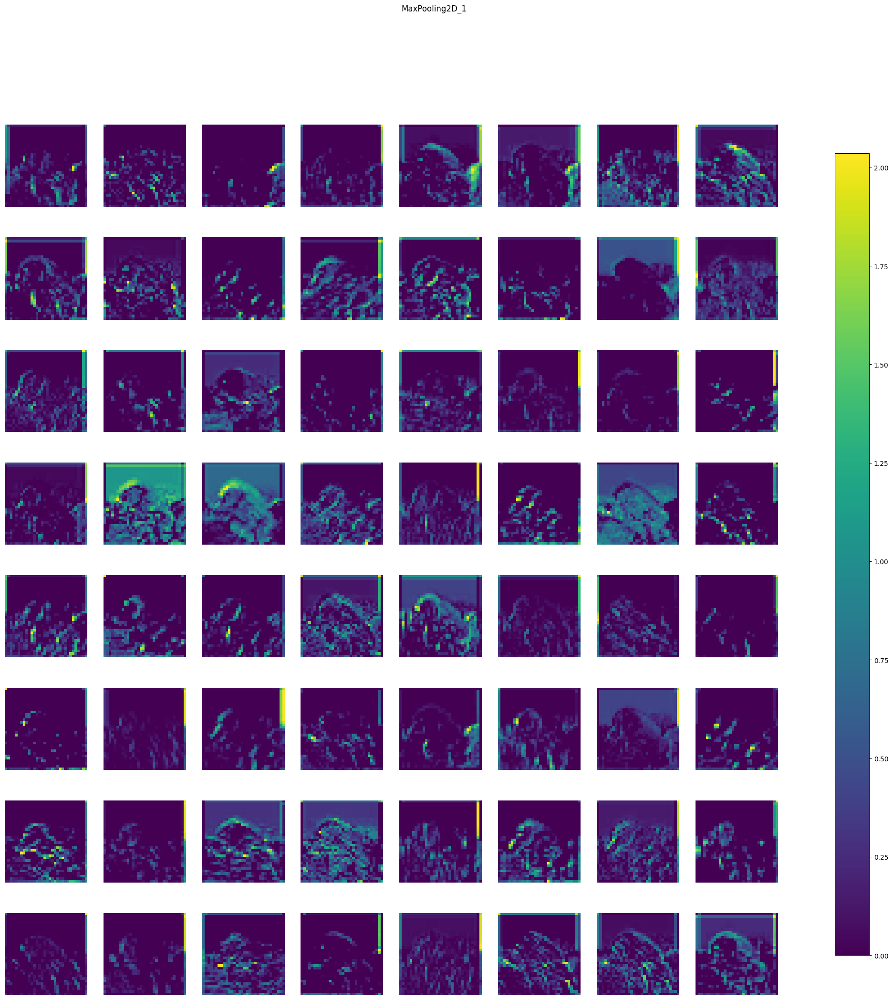

MaxPooling2D_2 (1, 16, 16, 128) 


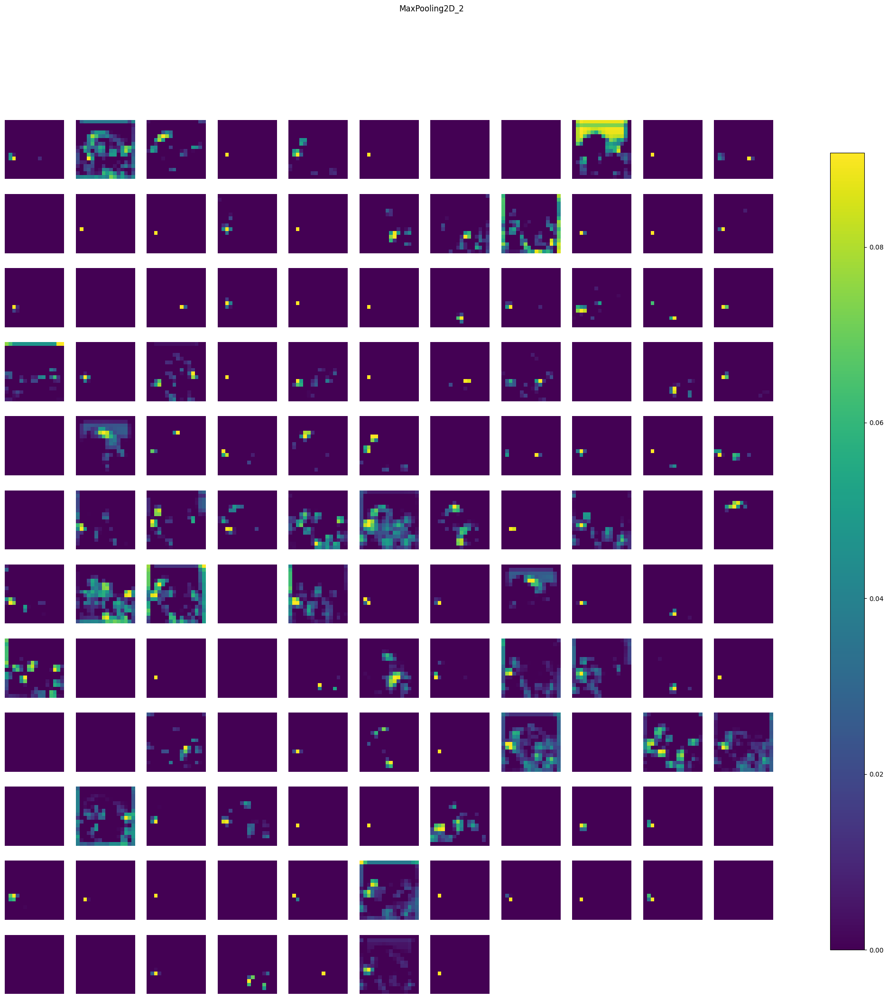

DenseResult (1, 1) 


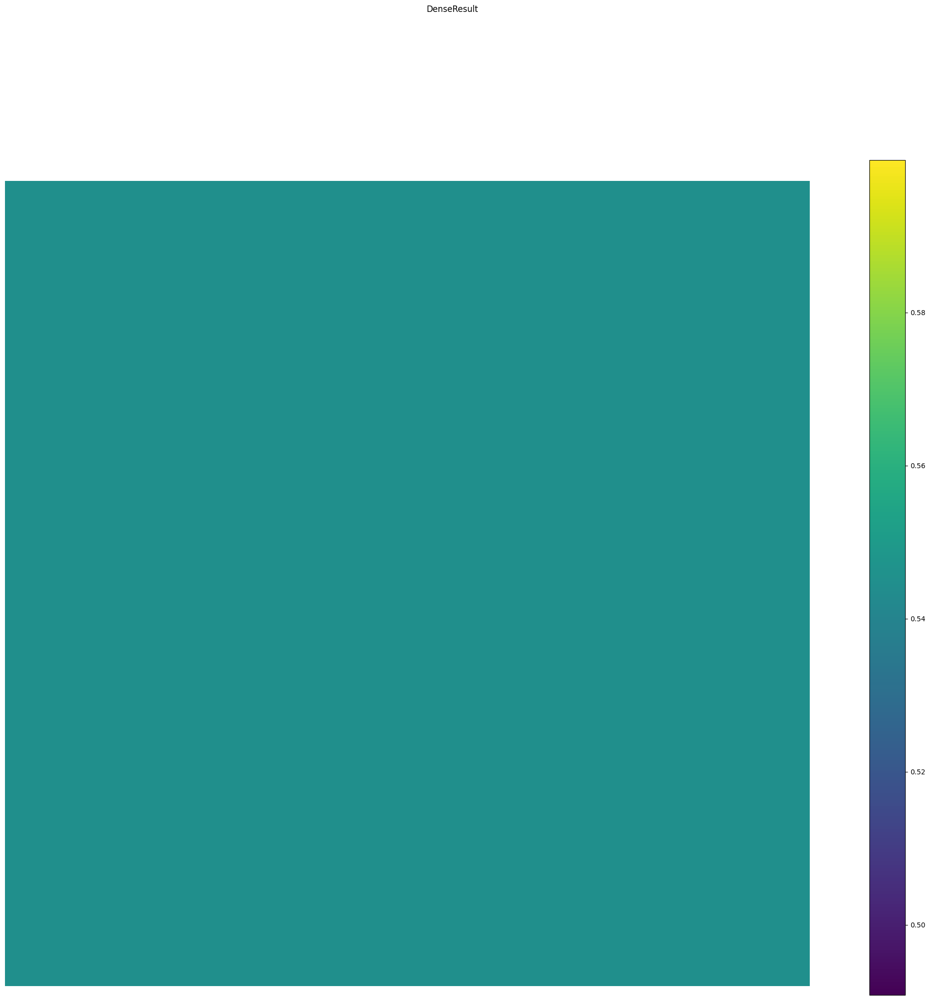

In [ ]:
# Fetch activations generated by the Keras model and an input im
activations = get_activations(vggnetlike_model, samples[0][None, :], layer_names=[
                              "MaxPooling2D_0", "MaxPooling2D_1", "MaxPooling2D_2", "DenseResult"])

# Show activation maps
display_activations(activations, save=False)


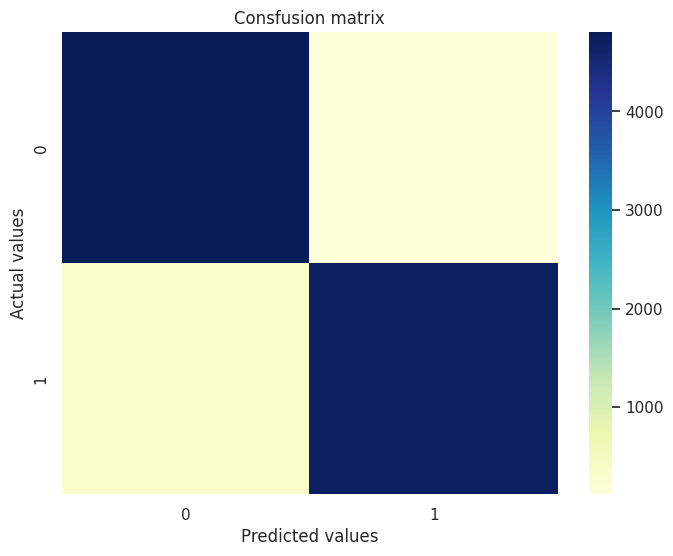

In [ ]:
results_filepath = os.path.join(
    BASE_DIR,
    f"vggnetlike_kfold_rgb_augmented_dataset_results",
    "kfold_results.json"
)
with open(results_filepath, "r") as in_file:
    kfold_results = json.load(in_file)

results = kfold_results["iterations"]["3"]["history"]
conf_mat = [
    [
        results["val_true_negatives"][-1],
        results["val_false_positives"][-1]
    ],
    [
        results["val_false_negatives"][-1],
        results["val_true_positives"][-1]
    ]
]

plt.figure(figsize=(8, 6))
sns.set_theme()

# Create the confusion matrix
ax = sns.heatmap(conf_mat, cmap="YlGnBu")
ax.set(title="Consfusion matrix", xlabel="Predicted values", ylabel="Actual values")
# Use this to "undo" sns.set() so that other functions creating graphs are unaffected
matplotlib.rc_file_defaults()

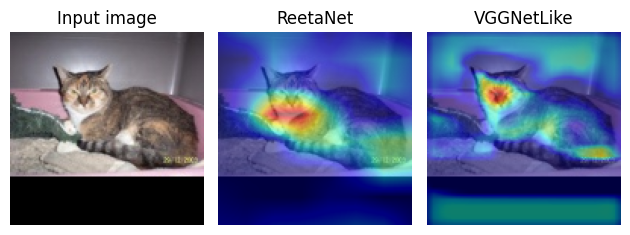

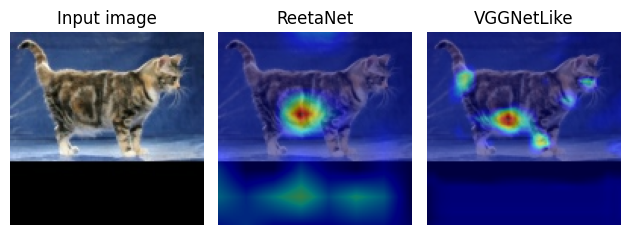

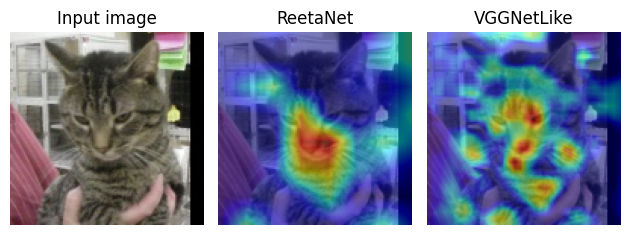

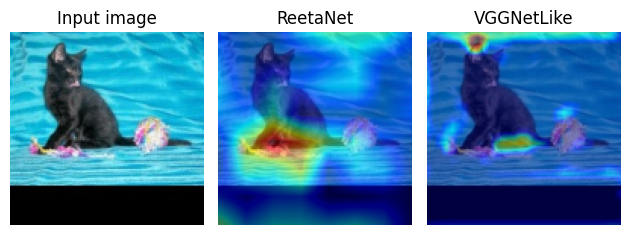

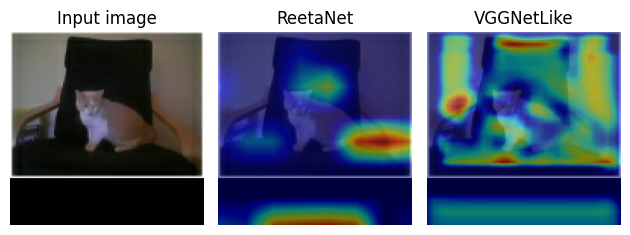

...

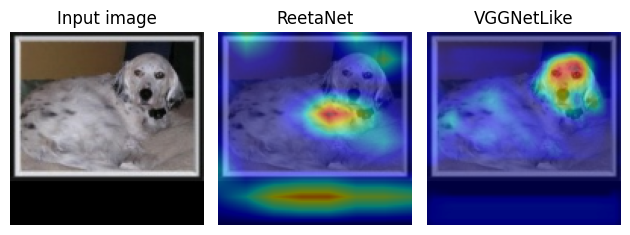

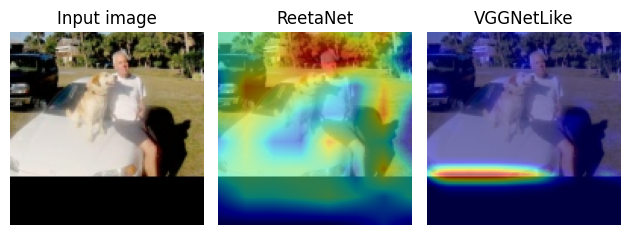

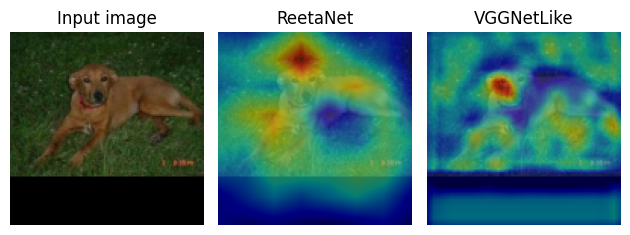

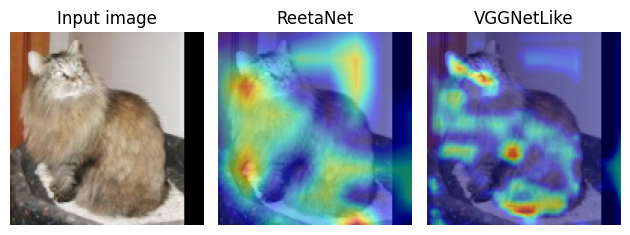

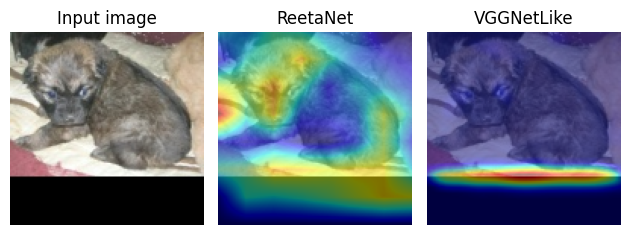

In [ ]:
# Do this after showing the confusion matrix: this alters the activation functions other visualizations depend on


dense1 = reetanet_model.layers[-2]
dense2 = reetanet_model.layers[-1]

dense1.activation = tf.keras.activations.relu
dense2.activation = tf.keras.activations.linear

dense1 = vggnetlike_model.layers[-2]
dense2 = vggnetlike_model.layers[-1]

dense1.activation = tf.keras.activations.relu
dense2.activation = tf.keras.activations.linear

for index in range(20, 40):
    sample = samples[index]
    im = sample[None, :]
    score = BinaryScore(labels[index])

    # Create Gradcam object
    gradcam_reetanet = Gradcam(reetanet_model)
    gradcam_vggnetlike = Gradcam(vggnetlike_model)

    # Generate heatmap with GradCAM
    cam_reetanet = gradcam_reetanet(score, im, penultimate_layer=-1)
    cam_vggnetlike = gradcam_vggnetlike(score, im, penultimate_layer=-1)

    heatmap_reetanet = np.uint8(cm.jet(cam_reetanet)[..., :3] * 255)
    heatmap_vggnetlike = np.uint8(cm.jet(cam_vggnetlike)[..., :3] * 255)
    overlays = {
        1: [(np.squeeze(heatmap_reetanet, axis=0), .5)],
        2: [(np.squeeze(heatmap_vggnetlike, axis=0), .5)],
    }

    show(images=[sample, sample, sample], labels=["Input image", "ReetaNet", "VGGNetLike"], overlays=overlays, ncols=3)
